**Group 2:** FAOUZI Walid, NDAW Abdoulaye, SHAN Jiameng, THEODORE Mary Sheeba, ROSSILLON Timothée

# **Group Project Principles and Elementary Models:**
# **Diabetes 130-US Hospitals for Years 1999-2008**

[Diabetes 130-US Hospitals for Years 1999-2008](https://archive.ics.uci.edu/dataset/296/diabetes+130-us+hospitals+for+years+1999-2008)

## **1. Introduction**

**Main steps :**

1.   **Introduction**
2.   **Exploratory Data Analysis (EDA)**
3.   **Data Preprocessing**
5.   **Modeling**
6.   **XAI**
7.  **Conclusion and perspectives**

### 1.1 Objectives of the dataset

**Dataset Overview**: The dataset includes information from 1999 to 2008 about patient care in 130 hospitals across the U.S. Each row represents the hospital records of a diabetes patient who received lab tests, medications, and stayed in the hospital for up to 14 days. The goal is to predict whether a patient will be readmitted to the hospital within 30 days after being discharged.

### 1.2 Import libraries and dataset

In [1]:
pip install ucimlrepo

In [2]:
#Import necessary packages
import pandas as pd
from ucimlrepo import fetch_ucirepo
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import math
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import xgboost as xgb
from imblearn.over_sampling import SMOTE
from sklearn.inspection import permutation_importance
from scipy.stats import randint, uniform
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    auc,
    roc_curve,
    classification_report,
    confusion_matrix,
    average_precision_score,
    precision_recall_curve,
    log_loss,
    make_scorer
)
from itertools import cycle
from collections import Counter
import shap
import warnings
warnings.filterwarnings("ignore")

shap.initjs()

In [ ]:
#import dataset
diabetes_130_us_hospitals_for_years_1999_2008 = fetch_ucirepo(id=296)

X = diabetes_130_us_hospitals_for_years_1999_2008.data.features
y = diabetes_130_us_hospitals_for_years_1999_2008.data.targets

data = pd.concat([X, y], axis=1)

## **2. Exploratory Data Analysis (EDA)**

### 2.1 Dataset Informations

In [ ]:
data.head()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,...,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,...,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 48 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      99493 non-null   object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   weight                    3197 non-null    object
 4   admission_type_id         101766 non-null  int64 
 5   discharge_disposition_id  101766 non-null  int64 
 6   admission_source_id       101766 non-null  int64 
 7   time_in_hospital          101766 non-null  int64 
 8   payer_code                61510 non-null   object
 9   medical_specialty         51817 non-null   object
 10  num_lab_procedures        101766 non-null  int64 
 11  num_procedures            101766 non-null  int64 
 12  num_medications           101766 non-null  int64 
 13  number_outpatient         101766 non-null  int64 
 14  numb

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
admission_type_id,101766.0,2.024006,1.445403,1.0,1.0,1.0,3.0,8.0
discharge_disposition_id,101766.0,3.715642,5.280166,1.0,1.0,1.0,4.0,28.0
admission_source_id,101766.0,5.754437,4.064081,1.0,1.0,7.0,7.0,25.0
time_in_hospital,101766.0,4.395987,2.985108,1.0,2.0,4.0,6.0,14.0
num_lab_procedures,101766.0,43.095641,19.674362,1.0,31.0,44.0,57.0,132.0
num_procedures,101766.0,1.339730,1.705807,0.0,0.0,1.0,2.0,6.0
num_medications,101766.0,16.021844,8.127566,1.0,10.0,15.0,20.0,81.0
number_outpatient,101766.0,0.369357,1.267265,0.0,0.0,0.0,0.0,42.0
number_emergency,101766.0,0.197836,0.930472,0.0,0.0,0.0,0.0,76.0
number_inpatient,101766.0,0.635566,1.262863,0.0,0.0,0.0,1.0,21.0


In [ ]:
data.shape

(101766, 48)

In [ ]:
#missing value check
nb_nan = round((data.isna().sum() / data.shape[0]) * 100, 2).astype(str) + ' %'
nb_nan

,0
race,2.23 %
gender,0.0 %
age,0.0 %
weight,96.86 %
admission_type_id,0.0 %
discharge_disposition_id,0.0 %
admission_source_id,0.0 %
time_in_hospital,0.0 %
payer_code,39.56 %
medical_specialty,49.08 %


In [ ]:
#missing value check
nb_null = round((data.isnull().sum() / data.shape[0]) * 100, 2).astype(str) + ' %'
nb_null

,0
race,2.23 %
gender,0.0 %
age,0.0 %
weight,96.86 %
admission_type_id,0.0 %
discharge_disposition_id,0.0 %
admission_source_id,0.0 %
time_in_hospital,0.0 %
payer_code,39.56 %
medical_specialty,49.08 %


In [ ]:
#missing value check
nb_question_marks = ((data == '?').sum() / data.shape[0] * 100).round(2).astype(str) + ' %'
nb_question_marks

,0
race,0.0 %
gender,0.0 %
age,0.0 %
weight,0.0 %
admission_type_id,0.0 %
discharge_disposition_id,0.0 %
admission_source_id,0.0 %
time_in_hospital,0.0 %
payer_code,0.0 %
medical_specialty,0.0 %


In [ ]:
#Categorical and numerical columns saved in respective variables
cat_columns = data.select_dtypes(include=['object', 'category']).columns
num_columns = data.select_dtypes(include=['int64', 'float64']).columns

### 2.2 Univariate Analysis

#### Histograms for distribution of each

In [ ]:
num_features = len(data.columns)
num_cols = 3
num_rows = math.ceil(num_features / num_cols)

In [ ]:
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=data.columns)

for i, col in enumerate(data.columns):
    row = i // num_cols + 1
    col_pos = i % num_cols + 1
    if data[col].dtype in ['int64', 'float64']:
        fig.add_trace(go.Histogram(
            x=data[col],
            name=col,
            marker_line_color='black',
            marker_line_width=1.5
        ), row=row, col=col_pos)
    else:
        value_counts = data[col].value_counts()
        fig.add_trace(go.Bar(
            x=value_counts.index,
            y=value_counts.values,
            name=col,
            marker_line_color='black',
            marker_line_width=1.5
        ), row=row, col=col_pos)

fig.update_layout(height=450*num_rows, width=450*num_cols, title_text="Distribution of all features", showlegend=False)
fig.show()

#### Number of modalities

In [ ]:
modalites_par_feature = {}

for col in data.columns:
    nb_modalites = data[col].nunique()
    modalites_par_feature[col] = nb_modalites

In [ ]:
df_modalites = pd.DataFrame.from_dict(modalites_par_feature, orient='index', columns=['Number of modalities'])
df_modalites = df_modalites.sort_values('Number of modalities', ascending=False)
df_modalites

,Number of modalities
diag_3,789
diag_2,748
diag_1,716
num_lab_procedures,118
num_medications,75
medical_specialty,72
number_outpatient,39
number_emergency,33
discharge_disposition_id,26
number_inpatient,21


#### Pie Chart Distribution

In [ ]:
features_with_few_modalities = [col for col in data.columns if data[col].nunique() <= 10]
num_cols = 3
num_rows = (len(features_with_few_modalities) + num_cols - 1) // num_cols

In [ ]:
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=features_with_few_modalities, specs=[[{'type':'domain'}]*num_cols]*num_rows)

colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA07A', '#FFD700', '#20B2AA', '#FF69B4', '#B0E0E6', '#FF4500']

for i, feature in enumerate(features_with_few_modalities):
    row = i // num_cols + 1
    col = i % num_cols + 1

    value_counts = data[feature].value_counts()
    percentages = value_counts / len(data) * 100

    fig.add_trace(go.Pie(
        labels=value_counts.index,
        values=value_counts.values,
        textinfo='label+percent',
        hoverinfo='label+percent',
        textposition='inside',
        insidetextorientation='radial',
        marker=dict(colors=colors[:len(value_counts)])
    ), row, col)

fig.update_layout(
    height=450*num_rows,
    width=450*num_cols,
    title_text="Distribution of features with 10 modalities or less",
    showlegend=False
)

fig.show()

#### Boxplot

In [ ]:
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
num_cols = 3
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols

In [ ]:
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=numeric_columns)

for i, col in enumerate(numeric_columns):
    row = i // num_cols + 1
    col_pos = i % num_cols + 1

    fig.add_trace(
        go.Box(y=data[col], name=col, boxmean=True),
        row=row, col=col_pos
    )

fig.update_layout(
    height=400*num_rows,
    width=400*num_cols,
    title_text="Boxplots of numerical variables",
    showlegend=False
)

fig.update_layout(margin=dict(t=100, l=50, r=50, b=50))

fig.show()

### 2.3 Bivariate Analysis

#### Correlation Matrix

In [ ]:
correlation_matrix = data[numeric_columns].corr()
correlation_matrix

,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
admission_type_id,1.000000,0.083483,0.106654,-0.012500,-0.143713,0.129888,0.079535,0.026511,-0.019116,-0.038161,-0.117126
discharge_disposition_id,0.083483,1.000000,0.018193,0.162748,0.023415,0.015921,0.108753,-0.008715,-0.024471,0.020787,0.046891
admission_source_id,0.106654,0.018193,1.000000,-0.006965,0.048885,-0.135400,-0.054533,0.027244,0.059892,0.036314,0.072114
time_in_hospital,-0.012500,0.162748,-0.006965,1.000000,0.318450,0.191472,0.466135,-0.008916,-0.009681,0.073623,0.220186
num_lab_procedures,-0.143713,0.023415,0.048885,0.318450,1.000000,0.058066,0.268161,-0.007602,-0.002279,0.039231,0.152773
num_procedures,0.129888,0.015921,-0.135400,0.191472,0.058066,1.000000,0.385767,-0.024819,-0.038179,-0.066236,0.073734
num_medications,0.079535,0.108753,-0.054533,0.466135,0.268161,0.385767,1.000000,0.045197,0.013180,0.064194,0.261526
number_outpatient,0.026511,-0.008715,0.027244,-0.008916,-0.007602,-0.024819,0.045197,1.000000,0.091459,0.107338,0.094152
number_emergency,-0.019116,-0.024471,0.059892,-0.009681,-0.002279,-0.038179,0.013180,0.091459,1.000000,0.266559,0.055539
number_inpatient,-0.038161,0.020787,0.036314,0.073623,0.039231,-0.066236,0.064194,0.107338,0.266559,1.000000,0.104710


In [ ]:
fig_corr = px.imshow(correlation_matrix,
                     title="Correlation matrix for numerical variables",
                     color_continuous_scale='RdBu_r',
                     zmin=-1, zmax=1,
                     text_auto=True,
                     width=900,
                     height=900)


#### Heatmap

In [ ]:
crosstab_gender = pd.crosstab(data['gender'], data['readmitted'], normalize='index')
fig_heatmap = px.imshow(crosstab_gender,
                        title="Heatmap: Gender vs Readmitted",
                        labels=dict(x="Readmitted", y="Gender", color="Proportion"),
                        text_auto=True,
                        width=800,
                        height=500)

fig_heatmap.update_traces(texttemplate='%{z:.2f}', textfont={"size": 14})
fig_heatmap.update_layout(
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False
)

In [ ]:
crosstab_gender = pd.crosstab(data['race'], data['readmitted'], normalize='index')
fig_heatmap = px.imshow(crosstab_gender,
                        title="Heatmap: Race vs Readmitted",
                        labels=dict(x="Readmitted", y="Race", color="Proportion"),
                        text_auto=True,
                        width=800,
                        height=800)

fig_heatmap.update_traces(texttemplate='%{z:.2f}', textfont={"size": 14})
fig_heatmap.update_layout(
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis_zeroline=False,
    yaxis_zeroline=False
)

#### Scatter Plot

In [ ]:
def plot_scatter_matrix(dataframe, quantitative_columns):
    fig = px.scatter_matrix(
        dataframe,
        dimensions=quantitative_columns,
        title="Scatter Plot Matrix",
        color_discrete_sequence=['#2E91E5'],
        width=2000,
        height=2000
    )

    fig.update_layout(
        font=dict(size=10),
    )
    fig.update_xaxes(tickangle=45)

    fig.show()

plot_scatter_matrix(data, numeric_columns)

###2.4 Mixed Analysis


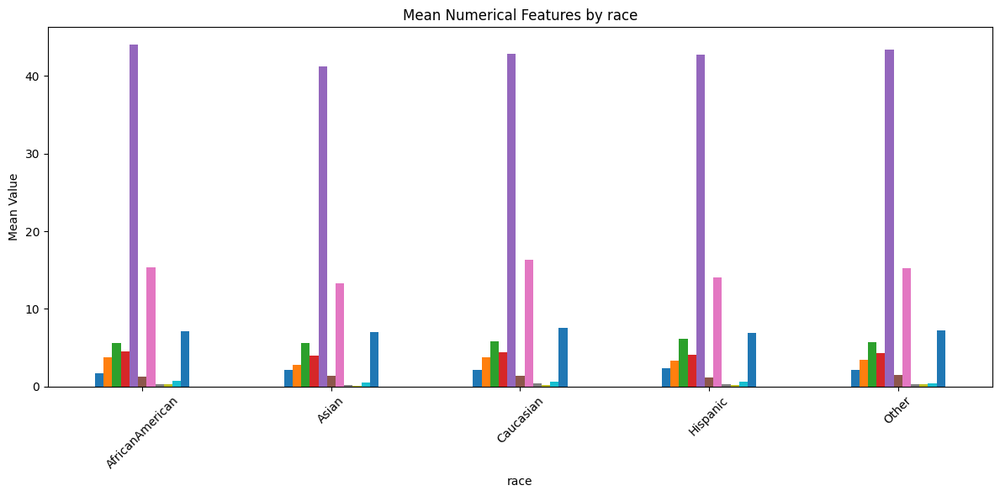

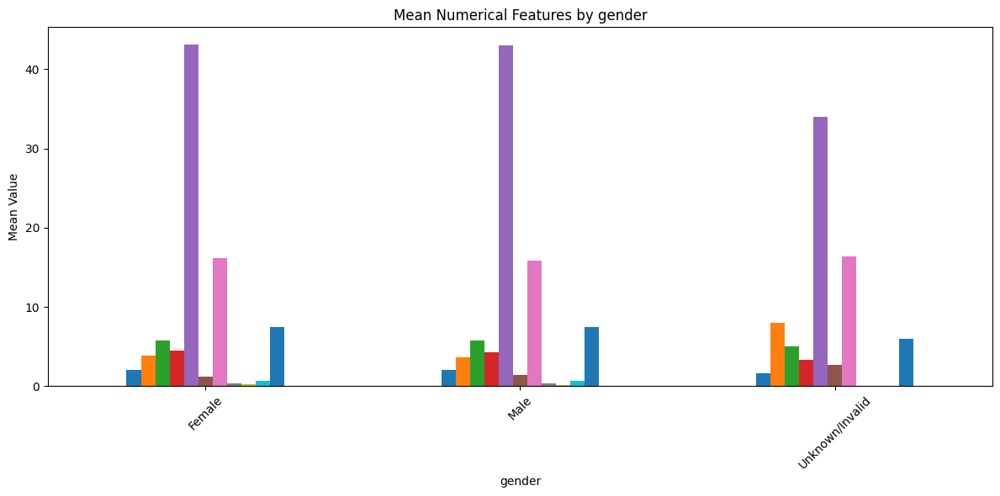

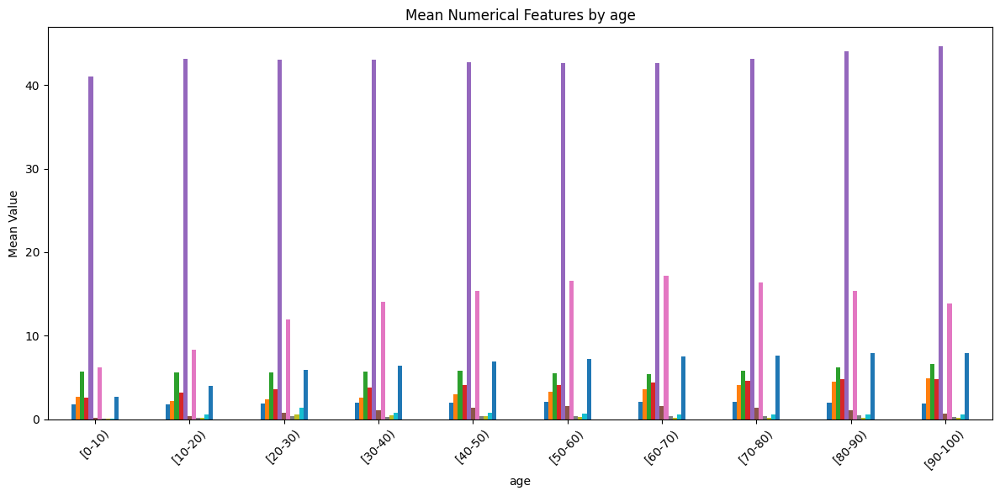

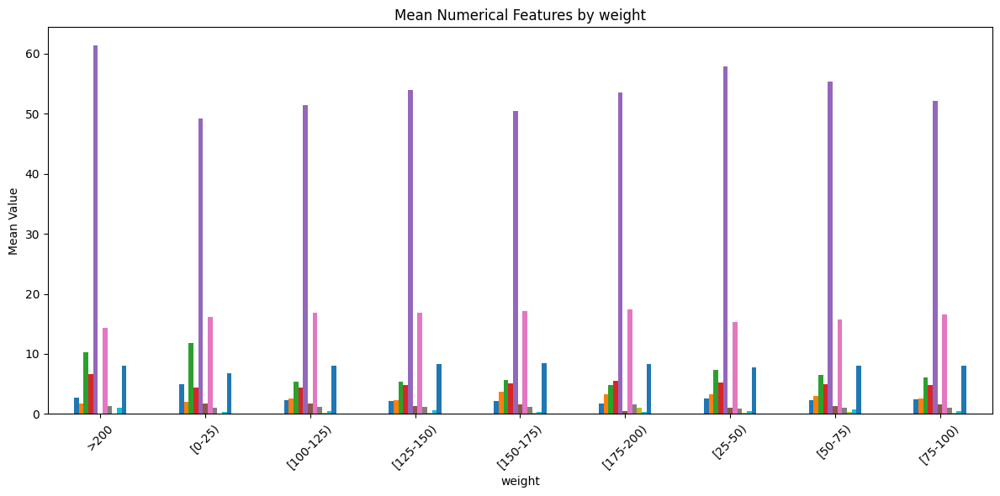

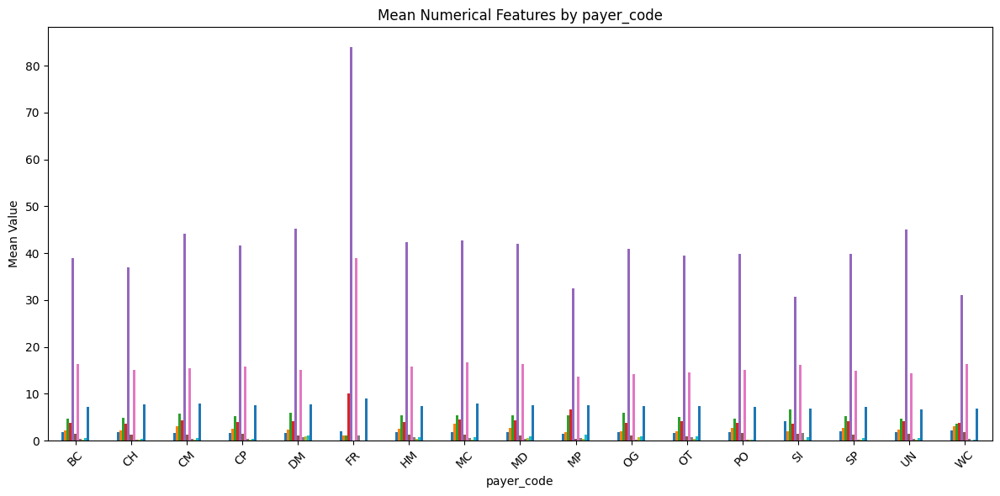

...

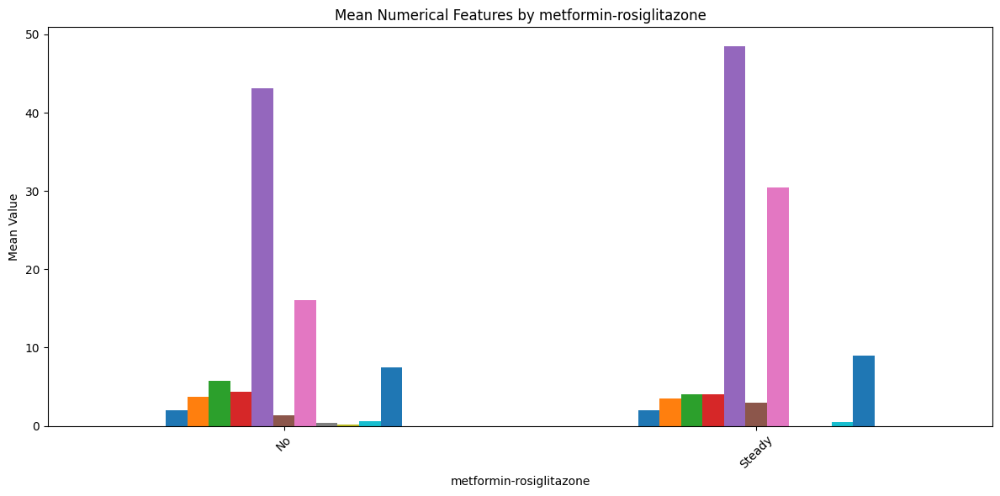

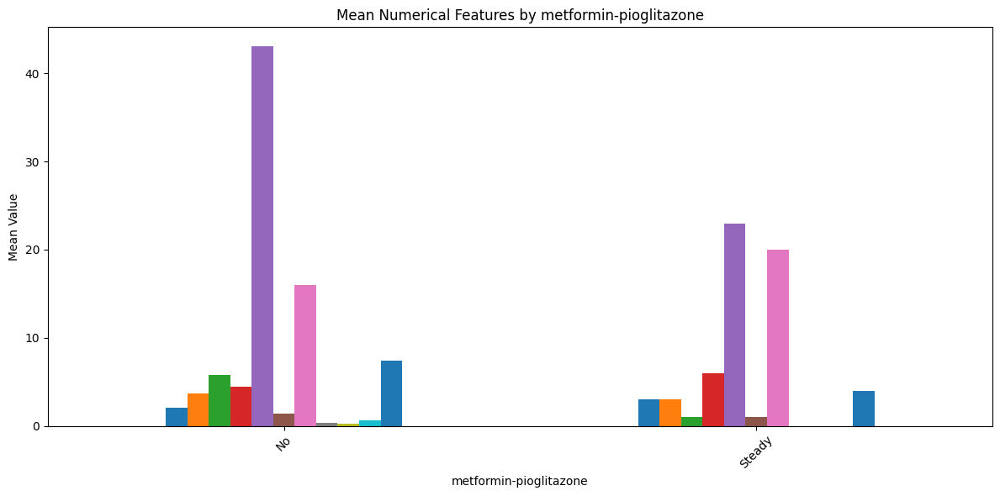

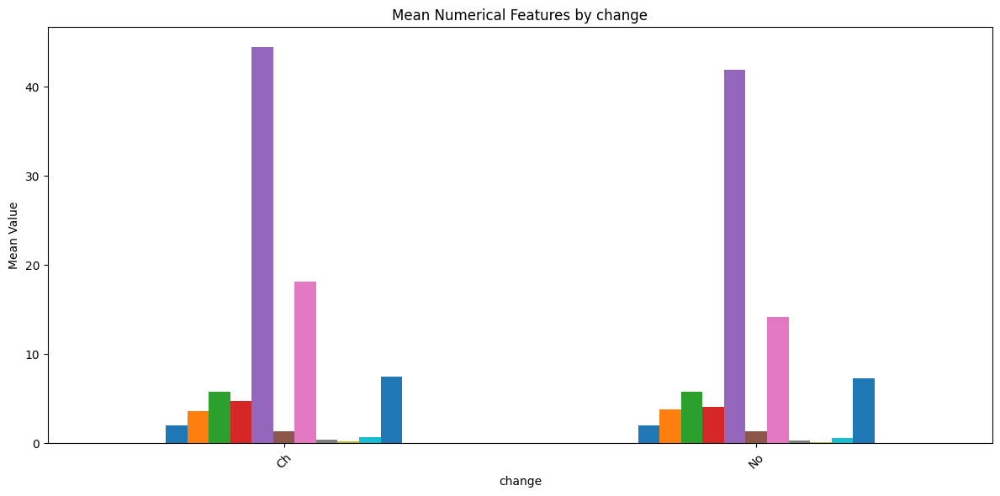

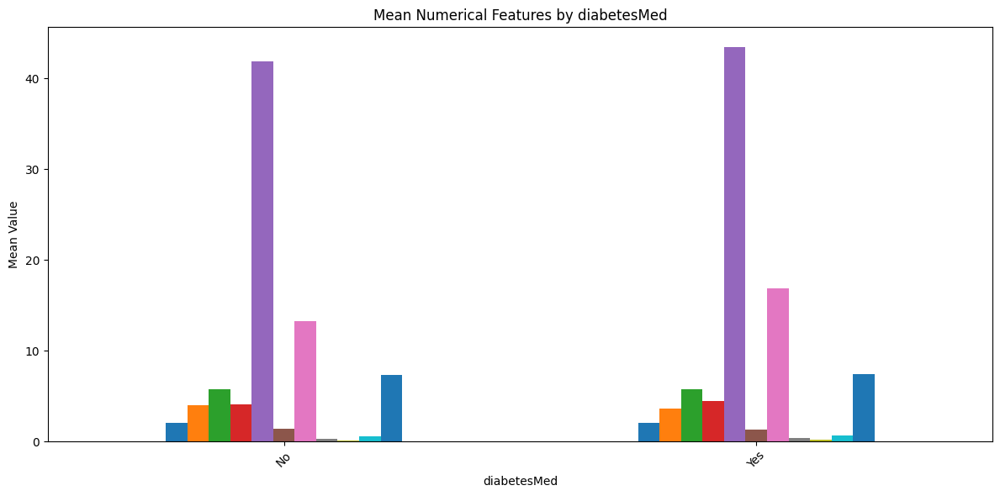

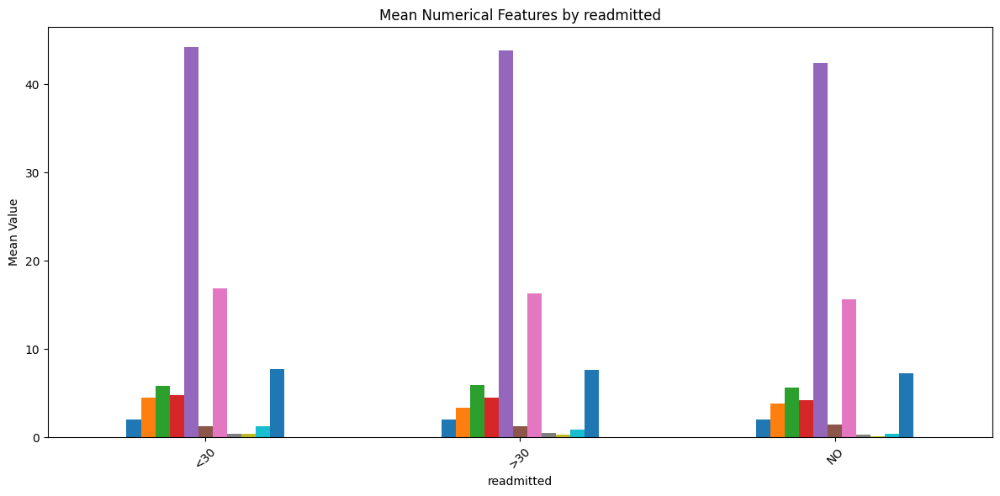

Numerical Trends Grouped by race


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
race,,,,,,,,,,,
AfricanAmerican,1.72,3.80,5.59,4.51,44.09,1.23,15.37,0.24,0.26,0.70,7.11
Asian,2.17,2.78,5.55,4.00,41.21,1.34,13.29,0.17,0.09,0.48,7.05
Caucasian,2.09,3.75,5.81,4.39,42.83,1.37,16.29,0.41,0.19,0.63,7.54
Hispanic,2.32,3.33,6.14,4.06,42.79,1.12,14.03,0.32,0.23,0.61,6.92
Other,2.14,3.40,5.74,4.27,43.44,1.53,15.19,0.26,0.24,0.45,7.19


Numerical Trends Grouped by gender


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
gender,,,,,,,,,,,
Female,2.00,3.82,5.77,4.48,43.15,1.24,16.19,0.38,0.22,0.65,7.43
Male,2.05,3.60,5.74,4.30,43.03,1.45,15.83,0.35,0.18,0.62,7.42
Unknown/Invalid,1.67,8.00,5.00,3.33,34.00,2.67,16.33,0.00,0.00,0.00,6.00


Numerical Trends Grouped by age


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
age,,,,,,,,,,,
[0-10),1.81,2.68,5.65,2.55,41.01,0.18,6.18,0.01,0.03,0.08,2.70
[10-20),1.76,2.15,5.61,3.19,43.10,0.34,8.28,0.17,0.16,0.53,3.95
[20-30),1.91,2.39,5.63,3.56,43.07,0.77,11.97,0.37,0.58,1.34,5.87
[30-40),2.01,2.56,5.71,3.80,43.03,1.11,14.09,0.29,0.49,0.76,6.45
[40-50),2.00,2.94,5.81,4.04,42.79,1.34,15.39,0.33,0.36,0.72,6.95
[50-60),2.05,3.24,5.53,4.13,42.61,1.56,16.58,0.33,0.22,0.62,7.24
[60-70),2.07,3.57,5.40,4.38,42.60,1.57,17.15,0.39,0.16,0.61,7.51
[70-80),2.07,4.11,5.80,4.59,43.16,1.38,16.41,0.39,0.13,0.61,7.65
[80-90),1.93,4.48,6.23,4.81,44.09,1.02,15.33,0.42,0.14,0.61,7.89


Numerical Trends Grouped by weight


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
weight,,,,,,,,,,,
>200,2.67,1.67,10.33,6.67,61.33,0.00,14.33,1.33,0.00,1.00,8.00
[0-25),4.92,1.96,11.85,4.46,49.19,1.75,16.19,1.00,0.02,0.35,6.77
[100-125),2.26,2.51,5.35,4.41,51.45,1.73,16.85,1.16,0.21,0.45,8.01
[125-150),2.10,2.31,5.31,4.88,53.94,1.38,16.81,1.15,0.20,0.64,8.31
[150-175),2.09,3.66,5.69,5.11,50.40,1.63,17.20,1.17,0.14,0.37,8.43
[175-200),1.73,3.27,4.82,5.45,53.55,0.45,17.36,1.55,1.00,0.27,8.27
[25-50),2.52,3.31,7.29,5.18,57.92,1.02,15.28,0.87,0.25,0.51,7.81
[50-75),2.28,2.97,6.51,5.02,55.40,1.25,15.75,1.04,0.30,0.75,7.97
[75-100),2.47,2.64,6.01,4.80,52.18,1.59,16.53,1.10,0.21,0.53,7.97


Numerical Trends Grouped by payer_code


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
payer_code,,,,,,,,,,,
BC,1.86,2.11,4.73,3.69,39.01,1.53,16.29,0.38,0.26,0.59,7.13
CH,1.81,2.12,4.84,3.53,36.90,1.25,15.14,0.18,0.14,0.29,7.78
CM,1.56,3.05,5.67,4.35,44.09,1.30,15.40,0.33,0.27,0.57,7.87
CP,1.70,2.47,5.16,3.88,41.69,1.37,15.82,0.35,0.12,0.44,7.52
DM,1.59,2.32,5.89,4.18,45.22,1.01,15.11,0.81,0.95,1.05,7.67
FR,2.00,1.00,1.00,10.00,84.00,0.00,39.00,1.00,0.00,0.00,9.00
HM,1.73,2.58,5.47,4.02,42.31,1.29,15.86,0.77,0.34,0.70,7.39
MC,1.82,3.55,5.45,4.48,42.64,1.20,16.78,0.51,0.21,0.70,7.89
MD,1.81,2.78,5.36,4.36,42.02,1.13,16.27,0.44,0.63,0.82,7.49


Numerical Trends Grouped by medical_specialty


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
medical_specialty,,,,,,,,,,,
AllergyandImmunology,5.43,4.71,6.14,3.86,49.29,0.71,18.57,0.29,0.43,1.43,5.86
Anesthesiology,2.25,1.17,2.25,2.92,32.50,1.08,15.83,0.67,0.17,0.42,6.08
Anesthesiology-Pediatric,1.68,2.53,4.95,2.53,49.42,0.16,9.47,0.00,0.00,0.37,3.00
Cardiology,2.73,2.48,5.59,3.53,43.04,2.70,17.06,0.29,0.08,0.43,7.09
Cardiology-Pediatric,2.00,1.00,2.29,2.86,29.14,0.00,6.14,0.00,0.14,0.14,4.14
...,...,...,...,...,...,...,...,...,...,...,...
Surgery-PlasticwithinHeadandNeck,6.00,1.00,1.00,1.00,28.00,3.00,15.00,0.00,0.00,0.00,5.00
Surgery-Thoracic,3.81,3.93,2.02,4.99,44.52,3.50,25.37,0.34,0.06,0.46,6.72
Surgery-Vascular,2.97,3.82,1.33,4.12,33.21,2.57,20.98,0.56,0.12,0.75,7.23


Numerical Trends Grouped by diag_1


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
diag_1,,,,,,,,,,,
10,2.00,1.00,1.00,12.00,49.00,6.00,32.00,0.00,0.00,0.00,9.00
11,1.60,1.30,5.80,6.20,53.30,1.70,18.10,0.10,0.00,0.20,6.60
110,1.00,4.50,4.50,6.50,43.00,0.50,18.00,0.00,0.00,0.00,9.00
112,1.62,3.55,6.19,5.55,48.81,1.08,18.19,0.37,0.19,0.85,8.15
114,3.00,6.00,1.00,11.00,77.00,4.00,41.00,2.00,0.00,0.00,9.00
...,...,...,...,...,...,...,...,...,...,...,...
V63,1.12,5.88,3.75,3.12,47.00,0.38,12.75,0.50,0.12,0.12,8.50
V66,4.00,9.50,10.50,7.50,26.50,0.00,9.50,0.00,0.00,2.50,7.00
V67,3.00,1.00,1.00,1.00,11.00,1.00,12.00,0.00,0.00,0.00,7.00


Numerical Trends Grouped by diag_2


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
diag_2,,,,,,,,,,,
11,1.67,2.33,4.33,6.67,49.67,1.33,24.67,0.33,0.67,0.33,8.00
110,2.62,5.25,8.38,4.00,30.00,0.62,13.75,0.12,0.00,0.38,6.25
111,2.00,1.00,7.00,1.00,44.00,0.00,7.00,0.00,1.00,0.00,2.00
112,1.96,3.73,6.67,5.48,48.08,1.01,18.23,0.34,0.22,0.87,7.84
114,1.00,1.00,7.00,6.00,56.00,0.00,14.00,0.00,0.00,0.00,8.00
...,...,...,...,...,...,...,...,...,...,...,...
V69,1.00,1.00,7.00,6.00,55.00,0.00,13.00,0.00,0.00,1.00,9.00
V70,3.00,1.71,2.71,4.14,22.29,2.57,11.43,0.14,0.00,0.14,8.43
V72,3.15,1.23,2.23,1.15,31.15,1.38,17.08,0.15,0.08,0.00,6.08


Numerical Trends Grouped by diag_3


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
diag_3,,,,,,,,,,,
11,1.00,2.00,6.00,6.00,44.50,3.00,15.00,0.00,0.50,1.50,9.00
110,2.45,4.70,7.20,4.75,40.15,0.75,14.90,0.35,0.75,0.80,7.70
111,1.00,1.00,7.00,7.00,28.00,0.00,11.00,0.00,0.00,3.00,9.00
112,1.83,3.57,6.17,6.04,49.76,1.23,19.66,0.29,0.17,0.61,7.83
115,3.00,1.00,1.00,3.00,29.00,2.00,21.00,0.00,0.00,0.00,7.00
...,...,...,...,...,...,...,...,...,...,...,...
V66,1.61,11.61,6.39,6.11,44.72,0.72,14.06,0.00,0.17,1.06,7.50
V70,7.00,15.50,1.00,6.50,24.50,1.50,12.00,0.00,0.00,0.00,4.50
V72,3.00,4.38,2.12,1.25,34.62,1.62,18.12,0.00,0.12,0.25,5.88


Numerical Trends Grouped by max_glu_serum


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
max_glu_serum,,,,,,,,,,,
>200,4.82,5.15,14.44,4.74,28.37,0.77,16.15,0.67,0.28,0.69,7.03
>300,4.10,4.58,12.61,5.39,36.80,0.82,17.22,0.62,0.46,1.04,7.13
Norm,4.54,4.54,14.44,3.98,26.31,0.75,14.05,0.67,0.27,0.66,6.91


Numerical Trends Grouped by A1Cresult


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
A1Cresult,,,,,,,,,,,
>7,1.88,3.61,5.62,4.89,53.41,1.32,16.84,0.34,0.13,0.43,7.70
>8,1.91,3.40,5.90,4.75,54.87,1.28,16.11,0.30,0.20,0.49,7.06
Norm,1.71,3.42,5.68,4.92,54.17,1.27,16.52,0.26,0.18,0.42,7.65


Numerical Trends Grouped by metformin


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
metformin,,,,,,,,,,,
Down,2.14,3.95,5.39,5.07,45.09,1.24,19.09,0.33,0.11,0.42,7.21
No,2.01,3.74,5.83,4.41,43.56,1.37,15.74,0.38,0.20,0.68,7.49
Steady,2.06,3.57,5.45,4.28,40.76,1.20,17.05,0.34,0.19,0.46,7.16
Up,2.09,3.98,5.67,5.36,46.52,1.22,18.10,0.27,0.10,0.37,7.05


Numerical Trends Grouped by repaglinide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
repaglinide,,,,,,,,,,,
Down,1.93,4.89,5.16,6.80,49.78,1.67,18.78,0.27,0.20,0.62,8.33
No,2.02,3.72,5.76,4.38,43.07,1.34,16.00,0.37,0.20,0.63,7.41
Steady,2.00,3.47,5.57,5.06,44.25,1.38,17.51,0.41,0.28,0.78,8.03
Up,1.81,3.89,5.95,6.43,53.75,1.41,18.56,0.34,0.27,0.65,8.07


Numerical Trends Grouped by nateglinide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
nateglinide,,,,,,,,,,,
Down,2.27,2.73,6.00,6.00,43.91,1.64,21.00,0.09,0.00,0.27,8.73
No,2.03,3.72,5.76,4.39,43.11,1.34,16.01,0.37,0.20,0.64,7.42
Steady,1.86,2.93,4.87,4.53,41.35,1.26,18.16,0.40,0.21,0.52,7.77
Up,1.96,3.71,6.25,5.50,47.54,1.21,20.12,0.21,0.88,0.67,8.12


Numerical Trends Grouped by chlorpropamide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
chlorpropamide,,,,,,,,,,,
Down,3.00,1.00,1.00,1.00,1.00,2.00,8.00,0.00,0.00,0.00,6.00
No,2.02,3.71,5.75,4.40,43.10,1.34,16.02,0.37,0.20,0.64,7.42
Steady,2.48,6.76,5.39,4.52,41.73,1.82,16.48,0.14,0.04,0.25,6.61
Up,1.50,7.33,5.00,6.50,47.83,0.83,17.00,0.17,0.00,0.83,6.83


Numerical Trends Grouped by glimepiride


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glimepiride,,,,,,,,,,,
Down,2.04,3.76,5.07,6.17,49.79,1.45,19.67,0.25,0.09,0.62,7.58
No,2.02,3.74,5.78,4.39,43.10,1.34,15.94,0.37,0.20,0.64,7.42
Steady,2.01,3.10,5.27,4.42,42.26,1.41,17.33,0.30,0.21,0.57,7.53
Up,2.04,4.55,5.42,6.13,50.34,1.48,19.91,0.24,0.16,0.47,7.46


Numerical Trends Grouped by acetohexamide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
acetohexamide,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42
Steady,1.00,22.00,7.00,14.0,68.0,4.00,34.00,0.00,0.0,0.00,9.00


Numerical Trends Grouped by glipizide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glipizide,,,,,,,,,,,
Down,2.06,4.02,5.87,5.89,49.46,1.45,19.01,0.42,0.12,0.67,7.63
No,2.02,3.74,5.74,4.38,43.00,1.34,15.85,0.37,0.20,0.65,7.43
Steady,2.07,3.45,5.84,4.35,43.13,1.35,17.02,0.40,0.19,0.55,7.39
Up,2.08,4.22,6.19,6.12,49.61,1.49,19.45,0.31,0.15,0.51,7.40


Numerical Trends Grouped by glyburide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glyburide,,,,,,,,,,,
Down,2.04,4.83,6.23,5.84,48.90,1.44,18.58,0.40,0.11,0.50,7.46
No,2.02,3.63,5.75,4.37,43.10,1.34,15.91,0.37,0.21,0.65,7.44
Steady,2.04,4.35,5.74,4.44,42.27,1.37,16.77,0.36,0.12,0.49,7.26
Up,1.95,4.88,6.16,5.80,47.50,1.37,17.77,0.32,0.10,0.45,7.35


Numerical Trends Grouped by tolbutamide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
tolbutamide,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.10,1.34,16.02,0.37,0.20,0.64,7.42
Steady,2.39,4.35,7.35,5.0,44.43,1.22,18.13,0.17,0.09,0.26,7.61


Numerical Trends Grouped by pioglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
pioglitazone,,,,,,,,,,,
Down,2.05,4.22,6.65,6.04,52.01,1.47,20.88,0.51,0.29,0.69,7.84
No,2.02,3.73,5.76,4.39,43.17,1.33,15.87,0.36,0.20,0.64,7.42
Steady,2.11,3.45,5.60,4.36,41.70,1.42,17.91,0.43,0.20,0.52,7.44
Up,2.09,3.89,6.63,6.60,49.71,1.41,19.37,0.32,0.17,0.50,7.50


Numerical Trends Grouped by rosiglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
rosiglitazone,,,,,,,,,,,
Down,2.40,4.29,5.47,5.78,46.89,1.79,19.11,0.46,0.03,0.45,7.40
No,2.02,3.72,5.76,4.39,43.15,1.33,15.91,0.37,0.20,0.64,7.43
Steady,2.14,3.60,5.60,4.39,42.03,1.43,17.62,0.36,0.17,0.53,7.36
Up,2.17,3.97,5.90,6.42,49.66,1.42,19.49,0.24,0.15,0.57,7.30


Numerical Trends Grouped by acarbose


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
acarbose,,,,,,,,,,,
Down,2.67,2.67,3.00,5.33,60.00,1.33,24.00,0.00,1.00,3.67,9.00
No,2.02,3.71,5.75,4.39,43.10,1.34,16.01,0.37,0.20,0.64,7.42
Steady,2.16,4.25,5.69,4.71,42.67,1.28,18.74,0.68,0.21,0.68,7.69
Up,2.20,5.20,5.90,5.10,51.10,1.50,19.80,0.20,0.00,0.00,6.90


Numerical Trends Grouped by miglitol


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
miglitol,,,,,,,,,,,
Down,1.80,6.60,4.60,3.80,39.20,1.20,16.80,2.00,0.00,2.80,8.20
No,2.02,3.71,5.75,4.40,43.10,1.34,16.02,0.37,0.20,0.64,7.42
Steady,2.00,5.90,5.90,4.61,38.45,1.42,18.19,0.16,0.16,0.39,7.58
Up,2.00,4.00,5.50,7.50,43.50,0.00,13.00,1.00,0.50,1.00,5.00


Numerical Trends Grouped by troglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
troglitazone,,,,,,,,,,,
No,2.02,3.72,5.75,4.40,43.10,1.34,16.02,0.37,0.2,0.64,7.42
Steady,2.67,10.00,7.00,6.33,56.67,0.00,19.33,0.00,0.0,0.00,8.67


Numerical Trends Grouped by tolazamide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
tolazamide,,,,,,,,,,,
No,2.02,3.71,5.75,4.40,43.10,1.34,16.02,0.37,0.20,0.64,7.42
Steady,2.71,5.61,6.11,3.95,42.34,1.55,14.97,0.03,0.05,0.29,6.21
Up,1.00,18.00,7.00,3.00,48.00,1.00,9.00,0.00,0.00,1.00,8.00


Numerical Trends Grouped by examide


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
examide,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42


Numerical Trends Grouped by citoglipton


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
citoglipton,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42


Numerical Trends Grouped by insulin


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
insulin,,,,,,,,,,,
Down,2.01,3.63,6.05,4.92,46.33,1.37,19.02,0.40,0.29,0.85,7.72
No,2.07,3.98,5.70,4.08,41.13,1.31,14.21,0.36,0.16,0.54,7.26
Steady,1.93,3.34,5.69,4.36,43.36,1.35,16.29,0.31,0.17,0.62,7.43
Up,2.10,3.73,5.83,5.24,47.11,1.39,19.63,0.53,0.35,0.83,7.77


Numerical Trends Grouped by glyburide-metformin


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glyburide-metformin,,,,,,,,,,,
Down,1.50,1.67,4.67,6.17,26.67,0.17,13.00,0.17,0.00,0.83,5.67
No,2.02,3.72,5.76,4.40,43.11,1.34,16.02,0.37,0.20,0.64,7.42
Steady,1.97,3.48,4.58,4.32,40.67,1.33,16.98,0.26,0.22,0.47,7.26
Up,2.38,1.00,4.25,2.88,36.62,0.50,12.38,0.62,0.25,0.12,6.00


Numerical Trends Grouped by glipizide-metformin


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glipizide-metformin,,,,,,,,,,,
No,2.02,3.72,5.75,4.40,43.1,1.34,16.02,0.37,0.2,0.64,7.42
Steady,1.46,3.92,5.62,4.23,30.0,0.54,18.54,0.54,0.0,0.54,6.85


Numerical Trends Grouped by glimepiride-pioglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
glimepiride-pioglitazone,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42
Steady,1.00,1.00,7.00,2.0,38.0,0.00,7.00,0.00,0.0,2.00,4.00


Numerical Trends Grouped by metformin-rosiglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
metformin-rosiglitazone,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42
Steady,2.00,3.50,4.00,4.0,48.5,3.00,30.50,0.00,0.0,0.50,9.00


Numerical Trends Grouped by metformin-pioglitazone


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
metformin-pioglitazone,,,,,,,,,,,
No,2.02,3.72,5.75,4.4,43.1,1.34,16.02,0.37,0.2,0.64,7.42
Steady,3.00,3.00,1.00,6.0,23.0,1.00,20.00,0.00,0.0,0.00,4.00


Numerical Trends Grouped by change


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
change,,,,,,,,,,,
Ch,2.04,3.65,5.77,4.75,44.45,1.35,18.19,0.40,0.24,0.67,7.53
No,2.01,3.78,5.75,4.09,41.93,1.33,14.16,0.34,0.16,0.61,7.33


Numerical Trends Grouped by diabetesMed


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
diabetesMed,,,,,,,,,,,
No,2.02,3.99,5.74,4.05,41.90,1.36,13.24,0.33,0.15,0.58,7.35
Yes,2.02,3.63,5.76,4.50,43.45,1.33,16.85,0.38,0.21,0.65,7.44


Numerical Trends Grouped by readmitted


,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses
readmitted,,,,,,,,,,,
<30,1.98,4.47,5.82,4.77,44.23,1.28,16.90,0.44,0.36,1.22,7.69
>30,2.03,3.36,5.97,4.50,43.84,1.25,16.28,0.50,0.28,0.84,7.65
NO,2.03,3.79,5.60,4.25,42.38,1.41,15.67,0.27,0.11,0.38,7.22


In [ ]:
cat_columns = data.select_dtypes(include=['object', 'category']).columns
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

selected_categorical = cat_columns
num_columns = numeric_columns

mixed_analysis_results = {}

missing_columns = [col for col in selected_categorical if col not in data.columns]
if missing_columns:
    warnings.warn(f"Missing categorical columns: {missing_columns}")

missing_numerical = [col for col in num_columns if col not in data.columns]
if missing_numerical:
    warnings.warn(f"Missing numerical columns: {missing_numerical}")

def perform_mixed_analysis(data, cat_columns, num_columns):
    """
    Analyze numerical features grouped by categorical features.
    Generates bar plots and returns grouped statistics.
    """
    results = {}
    for column in cat_columns:

        grouped_means = data.groupby(column)[num_columns].mean().round(2)
        results[column] = grouped_means


        grouped_means.plot(kind="bar", figsize=(12, 6), title=f"Mean Numerical Features by {column}", legend=False)
        plt.ylabel("Mean Value")
        plt.xlabel(column)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    return results

mixed_analysis_results = perform_mixed_analysis(data, selected_categorical, num_columns)

for column, grouped_stats in mixed_analysis_results.items():
    print(f"Numerical Trends Grouped by {column}")
    display(grouped_stats)


## **3. Data Preprocessing**

In [ ]:
#creating a copy of the original dateset
df = data.copy()

### 3.1 Data Cleaning

In [ ]:
df.readmitted.value_counts()

,count
readmitted,
NO,54864
>30,35545
<30,11357


In [ ]:
df.race.value_counts(dropna=False)

,count
race,
Caucasian,76099
AfricanAmerican,19210
NaN,2273
Hispanic,2037
Other,1506
Asian,641


In [ ]:
#df['patient_nbr'].value_counts(dropna=False)
#'patient_nbr' and 'encounter_id' not in the data from uci online dataset

In [ ]:
#Dropped features
features_drop_list = ['weight', 'payer_code', 'medical_specialty', 'repaglinide', 'nateglinide', 'chlorpropamide', 'acarbose', 'miglitol', 'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'glyburide-metformin', 'glipizide-metformin', 'glimepiride-pioglitazone', 'metformin-rosiglitazone','metformin-pioglitazone', 'acetohexamide', 'tolbutamide']

In [ ]:
df.drop(features_drop_list, axis=1,inplace=True)

In [ ]:
#We have 29 features now after the drop
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      99493 non-null   object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   admission_type_id         101766 non-null  int64 
 4   discharge_disposition_id  101766 non-null  int64 
 5   admission_source_id       101766 non-null  int64 
 6   time_in_hospital          101766 non-null  int64 
 7   num_lab_procedures        101766 non-null  int64 
 8   num_procedures            101766 non-null  int64 
 9   num_medications           101766 non-null  int64 
 10  number_outpatient         101766 non-null  int64 
 11  number_emergency          101766 non-null  int64 
 12  number_inpatient          101766 non-null  int64 
 13  diag_1                    101745 non-null  object
 14  diag

In [ ]:
df['admission_type_id'].value_counts()

,count
admission_type_id,
1,53990
3,18869
2,18480
6,5291
5,4785
8,320
7,21
4,10


In [ ]:
df['race'].value_counts(dropna=False)

,count
race,
Caucasian,76099
AfricanAmerican,19210
NaN,2273
Hispanic,2037
Other,1506
Asian,641


In [ ]:
#mapped_race = {"Asian":"Other","Hispanic":"Other", "?":"Other"}
#df.race = df.race.replace(mapped_race)

In [ ]:
#the mimority modalities of race feature are grouped into 1 group and the rest are kept as is
mapped_race = {"Asian": "Other", "Hispanic": "Other"}
df['race'] = df['race'].replace(mapped_race)
df['race'] = df['race'].fillna("Other")

In [ ]:
df['race']=df['race'].replace("Caucasian", 1)
df['race']=df['race'].replace("AfricanAmerican", 2)
df['race']=df['race'].replace("Other", 3)
df.race.value_counts()
#data['race'] = data['race'].replace(race_mapping)

,count
race,
1,76099
2,19210
3,6457


In [ ]:
df.gender.value_counts()

,count
gender,
Female,54708
Male,47055
Unknown/Invalid,3


In [ ]:
#Unknow gender rows are dropped - 3 rows, they do not add much value to the outcome, as they have readmitted value as NO
df = df[df.gender != "Unknown/Invalid"]

In [ ]:
df.gender.value_counts()

,count
gender,
Female,54708
Male,47055


In [ ]:
#Gender feature recoded
df['gender'] = df['gender'].replace('Male', 1)
df['gender'] = df['gender'].replace('Female', 0)
df.gender.value_counts()

,count
gender,
0,54708
1,47055


In [ ]:
df.age.value_counts()

,count
age,
[70-80),26066
[60-70),22482
[50-60),17256
[80-90),17197
[40-50),9685
[30-40),3775
[90-100),2793
[20-30),1657
[10-20),691


In [ ]:
#Age feature is computed with the midpoints
for i in range(0,10):
    df['age'] = df['age'].replace('['+str(10*i)+'-'+str(10*(i+1))+')', i*10+5)
df['age'].value_counts()

,count
age,
75,26066
65,22482
55,17256
85,17197
45,9685
35,3775
95,2793
25,1657
15,691


In [ ]:
#max_glu_serum feature recoded
df['max_glu_serum']=df['max_glu_serum'].replace(np.nan, 0)
df['max_glu_serum']=df['max_glu_serum'].replace("Norm", 1)
df['max_glu_serum']=df['max_glu_serum'].replace(">200", 2)
df['max_glu_serum']=df['max_glu_serum'].replace(">300", 3)
df.max_glu_serum.value_counts()

,count
max_glu_serum,
0,96417
1,2597
2,1485
3,1264


In [ ]:
df.A1Cresult.value_counts(dropna=False)

,count
A1Cresult,
NaN,84745
>8,8216
Norm,4990
>7,3812


In [ ]:
#A1Cresult feature recoded
df['A1Cresult']=df['A1Cresult'].replace(np.nan, 0)
df['A1Cresult']=df['A1Cresult'].replace("Norm", 1)
df['A1Cresult']=df['A1Cresult'].replace(">7", 2)
df['A1Cresult']=df['A1Cresult'].replace(">8", 3)

In [ ]:
df.A1Cresult.value_counts()

,count
A1Cresult,
0,84745
3,8216
1,4990
2,3812


In [ ]:
#diag_, diag_2, diag_3 features recoded 0 when it contains string value V and E
df.loc[df['diag_1'].str.contains('V',na=False,case=False), 'diag_1'] = 0
df.loc[df['diag_1'].str.contains('E',na=False,case=False), 'diag_1'] = 0
df.loc[df['diag_2'].str.contains('V',na=False,case=False), 'diag_2'] = 0
df.loc[df['diag_2'].str.contains('E',na=False,case=False), 'diag_2'] = 0
df.loc[df['diag_3'].str.contains('V',na=False,case=False), 'diag_3'] = 0
df.loc[df['diag_3'].str.contains('E',na=False,case=False), 'diag_3'] = 0

In [ ]:
#diag_, diag_2, diag_3 features 'NaN' is recoded with -1 value
df['diag_1'] = df['diag_1'].replace(np.nan, -1)
df['diag_2'] = df['diag_2'].replace(np.nan, -1)
df['diag_3'] = df['diag_3'].replace(np.nan, -1)

In [ ]:
#Datatype is changed from object to float as the feature contains float value
df['diag_1'] = df['diag_1'].astype(float)
df['diag_2'] = df['diag_2'].astype(float)
df['diag_3'] = df['diag_3'].astype(float)

In [ ]:
#We reduce the number of categories in diag features according to ICD-9 code
#Missing values will be grouped as E & V values
df['diag_1'].loc[(df['diag_1']>=1) & (df['diag_1']< 140)] = 1
df['diag_1'].loc[(df['diag_1']>=140) & (df['diag_1']< 240)] = 2
df['diag_1'].loc[(df['diag_1']>=240) & (df['diag_1']< 280)] = 3
df['diag_1'].loc[(df['diag_1']>=280) & (df['diag_1']< 290)] = 4
df['diag_1'].loc[(df['diag_1']>=290) & (df['diag_1']< 320)] = 5
df['diag_1'].loc[(df['diag_1']>=320) & (df['diag_1']< 390)] = 6
df['diag_1'].loc[(df['diag_1']>=390) & (df['diag_1']< 460)] = 7
df['diag_1'].loc[(df['diag_1']>=460) & (df['diag_1']< 520)] = 8
df['diag_1'].loc[(df['diag_1']>=520) & (df['diag_1']< 580)] = 9
df['diag_1'].loc[(df['diag_1']>=580) & (df['diag_1']< 630)] = 10
df['diag_1'].loc[(df['diag_1']>=630) & (df['diag_1']< 680)] = 11
df['diag_1'].loc[(df['diag_1']>=680) & (df['diag_1']< 710)] = 12
df['diag_1'].loc[(df['diag_1']>=710) & (df['diag_1']< 740)] = 13
df['diag_1'].loc[(df['diag_1']>=740) & (df['diag_1']< 760)] = 14
df['diag_1'].loc[(df['diag_1']>=760) & (df['diag_1']< 780)] = 15
df['diag_1'].loc[(df['diag_1']>=780) & (df['diag_1']< 800)] = 16
df['diag_1'].loc[(df['diag_1']>=800) & (df['diag_1']< 1000)] = 17
df['diag_1'].loc[(df['diag_1']==-1)] = 0

df['diag_2'].loc[(df['diag_2']>=1) & (df['diag_2']< 140)] = 1
df['diag_2'].loc[(df['diag_2']>=140) & (df['diag_2']< 240)] = 2
df['diag_2'].loc[(df['diag_2']>=240) & (df['diag_2']< 280)] = 3
df['diag_2'].loc[(df['diag_2']>=280) & (df['diag_2']< 290)] = 4
df['diag_2'].loc[(df['diag_2']>=290) & (df['diag_2']< 320)] = 5
df['diag_2'].loc[(df['diag_2']>=320) & (df['diag_2']< 390)] = 6
df['diag_2'].loc[(df['diag_2']>=390) & (df['diag_2']< 460)] = 7
df['diag_2'].loc[(df['diag_2']>=460) & (df['diag_2']< 520)] = 8
df['diag_2'].loc[(df['diag_2']>=520) & (df['diag_2']< 580)] = 9
df['diag_2'].loc[(df['diag_2']>=580) & (df['diag_2']< 630)] = 10
df['diag_2'].loc[(df['diag_2']>=630) & (df['diag_2']< 680)] = 11
df['diag_2'].loc[(df['diag_2']>=680) & (df['diag_2']< 710)] = 12
df['diag_2'].loc[(df['diag_2']>=710) & (df['diag_2']< 740)] = 13
df['diag_2'].loc[(df['diag_2']>=740) & (df['diag_2']< 760)] = 14
df['diag_2'].loc[(df['diag_2']>=760) & (df['diag_2']< 780)] = 15
df['diag_2'].loc[(df['diag_2']>=780) & (df['diag_2']< 800)] = 16
df['diag_2'].loc[(df['diag_2']>=800) & (df['diag_2']< 1000)] = 17
df['diag_2'].loc[(df['diag_2']==-1)] = 0

df['diag_3'].loc[(df['diag_3']>=1) & (df['diag_3']< 140)] = 1
df['diag_3'].loc[(df['diag_3']>=140) & (df['diag_3']< 240)] = 2
df['diag_3'].loc[(df['diag_3']>=240) & (df['diag_3']< 280)] = 3
df['diag_3'].loc[(df['diag_3']>=280) & (df['diag_3']< 290)] = 4
df['diag_3'].loc[(df['diag_3']>=290) & (df['diag_3']< 320)] = 5
df['diag_3'].loc[(df['diag_3']>=320) & (df['diag_3']< 390)] = 6
df['diag_3'].loc[(df['diag_3']>=390) & (df['diag_3']< 460)] = 7
df['diag_3'].loc[(df['diag_3']>=460) & (df['diag_3']< 520)] = 8
df['diag_3'].loc[(df['diag_3']>=520) & (df['diag_3']< 580)] = 9
df['diag_3'].loc[(df['diag_3']>=580) & (df['diag_3']< 630)] = 10
df['diag_3'].loc[(df['diag_3']>=630) & (df['diag_3']< 680)] = 11
df['diag_3'].loc[(df['diag_3']>=680) & (df['diag_3']< 710)] = 12
df['diag_3'].loc[(df['diag_3']>=710) & (df['diag_3']< 740)] = 13
df['diag_3'].loc[(df['diag_3']>=740) & (df['diag_3']< 760)] = 14
df['diag_3'].loc[(df['diag_3']>=760) & (df['diag_3']< 780)] = 15
df['diag_3'].loc[(df['diag_3']>=780) & (df['diag_3']< 800)] = 16
df['diag_3'].loc[(df['diag_3']>=800) & (df['diag_3']< 1000)] = 17
df['diag_3'].loc[(df['diag_3']==-1)] = 0

In [ ]:
#All these features are recoded
#df.metformin.value_counts()
#df.glimepiride.value_counts()
#df.glipizide.value_counts()
#df.glyburide.value_counts()
#df.pioglitazone.value_counts()
#df.rosiglitazone.value_counts()
df.insulin.value_counts()

,count
insulin,
No,47380
Steady,30849
Down,12218
Up,11316


In [ ]:
drug_list = ['metformin', 'glimepiride', 'glipizide', 'glyburide', 'pioglitazone', 'rosiglitazone', 'insulin']
for i in drug_list:
    df[i] = df[i].replace('No', 0)
    df[i] = df[i].replace('Steady', 2)
    df[i] = df[i].replace('Down', 1)
    df[i] = df[i].replace('Up', 3)

In [ ]:
df.rosiglitazone.value_counts()

,count
rosiglitazone,
0,95399
2,6099
3,178
1,87


In [ ]:
df.glipizide.value_counts()

,count
glipizide,
0,89078
2,11355
3,770
1,560


In [ ]:
df.change.value_counts()

,count
change,
No,54754
Ch,47009


In [ ]:
#Change feature recoded to 1 and 0
df.change = df.change.replace('Ch', 1)
df.change = df.change.replace('No', 0)
df.change.value_counts()

,count
change,
0,54754
1,47009


In [ ]:
df['diabetesMed'].value_counts()

,count
diabetesMed,
Yes,78361
No,23402


In [ ]:
#diabetesMed feature recoded to 1 and 0
df['diabetesMed']=df['diabetesMed'].replace('Yes', 1)
df['diabetesMed']=df['diabetesMed'].replace('No', 0)
df.diabetesMed.value_counts()

,count
diabetesMed,
1,78361
0,23402


In [ ]:
df.admission_type_id.value_counts()

,count
admission_type_id,
1,53988
3,18868
2,18480
6,5291
5,4785
8,320
7,21
4,10


In [ ]:
admission_type_mapping = {1: 1, 2: 1, 3: 3, 4: 4, 5: 5, 6: 5, 7: 1, 8: 5}
df['admission_type_id'] = df['admission_type_id'].map(admission_type_mapping)

In [ ]:
df.admission_type_id.value_counts()

,count
admission_type_id,
1,72489
3,18868
5,10396
4,10


In [ ]:
df['discharge_disposition_id'].unique()

array([25,  1,  3,  6,  2,  5, 11,  7, 10,  4, 14, 18,  8, 13, 12, 16, 17,
       22, 23,  9, 20, 15, 24, 28, 19, 27])

In [ ]:
#Numeric Mapping for discharge_disposition_id

discharge_disposition_mapping = {
    1: 1, 6: 1, 8: 1,  # Home
    2: 2, 3: 2, 4: 2, 5: 2, 10: 2, 15: 2, 16: 2, 17: 2, 22: 2, 23: 2, 24: 2, 27: 2, 28: 2, 29: 2, 30: 2,  # Transfers
    11: 3, 19: 3, 20: 3, 21: 3,  # Expired
    13: 4, 14: 4,  # Hospice
    7: 5,  # Left AMA
    12: 6, 9: 6,  # Still patient/Admitted as inpatient (considered Unknown/Incomplete)
    18: 6, 25: 6, 26: 6  # Unknown/Invalid
}
df['discharge_disposition_id'].fillna(6, inplace=True)
df['discharge_disposition_id'] = df['discharge_disposition_id'].map(discharge_disposition_mapping)
df['discharge_disposition_id'].value_counts()

,count
discharge_disposition_id,
1,73242
2,20771
6,4704
3,1652
4,771
5,623


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101763 entries, 0 to 101765
Data columns (total 29 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   race                      101763 non-null  int64  
 1   gender                    101763 non-null  int64  
 2   age                       101763 non-null  int64  
 3   admission_type_id         101763 non-null  int64  
 4   discharge_disposition_id  101763 non-null  int64  
 5   admission_source_id       101763 non-null  int64  
 6   time_in_hospital          101763 non-null  int64  
 7   num_lab_procedures        101763 non-null  int64  
 8   num_procedures            101763 non-null  int64  
 9   num_medications           101763 non-null  int64  
 10  number_outpatient         101763 non-null  int64  
 11  number_emergency          101763 non-null  int64  
 12  number_inpatient          101763 non-null  int64  
 13  diag_1                    101763 non-null  float6

In [ ]:
print(df['admission_source_id'].unique())

[ 1  7  2  4  5  6 20  3 17  8  9 14 10 22 11 25 13]


In [ ]:
#Numeric Mapping for admission_source_id

#Referral Sources → 1
#Transfers → 2
#Emergency → 3
#Births → 4
#Unavailable/Unknown → 5
#Special Cases → 6
admission_source_mapping_numeric = {
    1: 1, 2: 1, 3: 1,  # Referral Sources
    4: 2, 5: 2, 6: 2, 10: 2, 22: 2, 25: 2,  # Transfers
    7: 3, 8: 3,  # Emergency
    11: 4, 13: 4, 14: 4,  # Births
    9: 5, 17: 5, 20: 5 # Unavailable/Unknown
}

df['admission_source_id'] = df['admission_source_id'].map(admission_source_mapping_numeric)
df['admission_source_id'].value_counts()


,count
admission_source_id,
3,57508
1,30855
5,7067
2,6328
4,5


In [ ]:
df = df.rename(columns={'admission_type_id': 'admission_urgency'})
df = df.rename(columns={'discharge_disposition_id': 'discharge_category'})
df = df.rename(columns={'admission_source_id': 'admission_source_category'})
df.columns

Index(['race', 'gender', 'age', 'admission_urgency', 'discharge_category',
       'admission_source_category', 'time_in_hospital', 'num_lab_procedures',
       'num_procedures', 'num_medications', 'number_outpatient',
       'number_emergency', 'number_inpatient', 'diag_1', 'diag_2', 'diag_3',
       'number_diagnoses', 'max_glu_serum', 'A1Cresult', 'metformin',
       'glimepiride', 'glipizide', 'glyburide', 'pioglitazone',
       'rosiglitazone', 'insulin', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

In [ ]:
#keep the dataframe for the multiclass classification
df_multi = df.copy()

In [ ]:
#Target variable 'readmitted' recoded
df['readmitted'] = df['readmitted'].replace({"NO": 0, ">30": 0, "<30": 1})
df.readmitted.value_counts()

,count
readmitted,
0,90406
1,11357


In [ ]:
df_multi['readmitted'] = df_multi['readmitted'].replace({"NO": 0, ">30": 1, "<30": 2})
df_multi.readmitted.value_counts()

,count
readmitted,
0,54861
1,35545
2,11357


In [ ]:
df.head()

,race,gender,age,admission_urgency,discharge_category,admission_source_category,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,metformin,glimepiride,glipizide,glyburide,pioglitazone,rosiglitazone,insulin,change,diabetesMed,readmitted
0,1,0,5,5,6,1,1,41,0,1,...,0,0,0,0,0,0,0,0,0,0
1,1,0,15,1,1,3,3,59,0,18,...,0,0,0,0,0,0,3,1,1,0
2,2,0,25,1,1,3,2,11,5,13,...,0,0,2,0,0,0,0,0,1,0
3,1,1,35,1,1,3,2,44,1,16,...,0,0,0,0,0,0,3,1,1,0
4,1,1,45,1,1,3,1,51,0,8,...,0,0,2,0,0,0,2,1,1,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101763 entries, 0 to 101765
Data columns (total 29 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   race                       101763 non-null  int64  
 1   gender                     101763 non-null  int64  
 2   age                        101763 non-null  int64  
 3   admission_urgency          101763 non-null  int64  
 4   discharge_category         101763 non-null  int64  
 5   admission_source_category  101763 non-null  int64  
 6   time_in_hospital           101763 non-null  int64  
 7   num_lab_procedures         101763 non-null  int64  
 8   num_procedures             101763 non-null  int64  
 9   num_medications            101763 non-null  int64  
 10  number_outpatient          101763 non-null  int64  
 11  number_emergency           101763 non-null  int64  
 12  number_inpatient           101763 non-null  int64  
 13  diag_1                     101763 

In [ ]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

### 3.2 Permutation Importance

#### Logistic Regression

In [ ]:
# Splitting the data
X = df.drop(['readmitted'], axis=1)
y = df['readmitted']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Logistic Regression Model
model = LogisticRegression(class_weight='balanced',max_iter=1000, random_state=42)
model.fit(X_train, y_train)

# Model Predictions
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]  # Probabilities for ROC AUC

# Metrics Calculation
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_proba)

# Print Metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("\nMetrics Summary:")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print(f"ROC AUC Score: {roc_auc:.2f}")

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba)

# Plotting ROC Curve using Plotly
roc_curve_fig = go.Figure()
roc_curve_fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'ROC Curve (AUC = {roc_auc:.2f})'))
roc_curve_fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name="Random Guess", line=dict(dash='dash')))
roc_curve_fig.update_layout(
    title="ROC Curve",
    xaxis_title="False Positive Rate",
    yaxis_title="True Positive Rate",
    legend_title="Legend",
    template="plotly_white"
)
roc_curve_fig.show()

# Permutation Importance
perm_importance = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42)

# Sorting and Extracting the Results
sorted_idx = perm_importance.importances_mean.argsort()
feature_names = X_test.columns[sorted_idx]
importance_values = perm_importance.importances_mean[sorted_idx]

# Print Permutation Importance in Table Format
print("\nPermutation Importance Values:")
print("{:<25} {:<15}".format("Feature", "Importance"))
print("-" * 40)
for feature, importance in zip(feature_names, importance_values):
    print(f"{feature:<25} {importance:.5f}")

# Plotting Feature Importances using Plotly
feature_importance_fig = go.Figure()
feature_importance_fig.add_trace(go.Bar(
    x=importance_values,
    y=feature_names,
    orientation='h'
))
feature_importance_fig.update_layout(
    title="Feature Importance for 'readmitted'",
    xaxis_title="Permutation Importance",
    yaxis_title="Features",
    template="plotly_white",
    height = 800,
    yaxis=dict(title="Features", automargin=True)
)
feature_importance_fig.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.69      0.79     18084
           1       0.17      0.51      0.25      2269

    accuracy                           0.67     20353
   macro avg       0.54      0.60      0.52     20353
weighted avg       0.83      0.67      0.73     20353


Metrics Summary:
Accuracy: 0.67
Precision: 0.17
Recall: 0.51
F1 Score: 0.25
ROC AUC Score: 0.65



Permutation Importance Values:
Feature                   Importance     
----------------------------------------
time_in_hospital          -0.00962
number_diagnoses          -0.00917
age                       -0.00831
num_medications           -0.00727
discharge_category        -0.00412
diag_3                    -0.00271
change                    -0.00251
num_lab_procedures        -0.00202
race                      -0.00103
diag_1                    -0.00080
A1Cresult                 -0.00076
gender                    -0.00074
max_glu_serum             -0.00036
diag_2                    -0.00030
admission_urgency         -0.00030
admission_source_category -0.00019
number_outpatient         -0.00002
glimepiride               0.00020
glipizide                 0.00025
pioglitazone              0.00044
rosiglitazone             0.00058
metformin                 0.00193
glyburide                 0.00206
num_procedures            0.00220
number_emergency          0.00245
insulin           

##### Decision Tree - Permutation importance

In [ ]:
# Importing the necessary library
from sklearn.tree import DecisionTreeClassifier
from sklearn.inspection import permutation_importance

# Splitting the data (reuse from Logistic Regression)
X = df.drop(['readmitted'], axis=1)
y = df['readmitted']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier Model
dt_model = DecisionTreeClassifier(class_weight='balanced', random_state=42)
dt_model.fit(X_train, y_train)

# Model Predictions
y_pred_dt = dt_model.predict(X_test)
y_proba_dt = dt_model.predict_proba(X_test)[:, 1]  # Probabilities for ROC AUC

# Metrics Calculation
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt)
recall_dt = recall_score(y_test, y_pred_dt)
f1_dt = f1_score(y_test, y_pred_dt)
roc_auc_dt = roc_auc_score(y_test, y_proba_dt)

# Print Metrics
print("Classification Report (Decision Tree):")
print(classification_report(y_test, y_pred_dt))

print("\nMetrics Summary (Decision Tree):")
print(f"Accuracy: {accuracy_dt:.2f}")
print(f"Precision: {precision_dt:.2f}")
print(f"Recall: {recall_dt:.2f}")
print(f"F1 Score: {f1_dt:.2f}")
print(f"ROC AUC Score: {roc_auc_dt:.2f}")

# ROC Curve for Decision Tree
fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test, y_proba_dt)

# Plotting ROC Curve using Plotly
roc_curve_fig_dt = go.Figure()
roc_curve_fig_dt.add_trace(go.Scatter(x=fpr_dt, y=tpr_dt, mode='lines', name=f'ROC Curve (AUC = {roc_auc_dt:.2f})'))
roc_curve_fig_dt.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name="Random Guess", line=dict(dash='dash')))
roc_curve_fig_dt.update_layout(
    title="ROC Curve (Decision Tree)",
    xaxis_title="False Positive Rate",
    yaxis_title="True Positive Rate",
    legend_title="Legend",
    template="plotly_white"
)
roc_curve_fig_dt.show()

# Permutation Importance for Decision Tree
perm_importance_dt = permutation_importance(dt_model, X_test, y_test, n_repeats=10, random_state=42)

# Sorting and Extracting the Results
sorted_idx_dt = perm_importance_dt.importances_mean.argsort()
feature_names_dt = X_test.columns[sorted_idx_dt]
importance_values_dt = perm_importance_dt.importances_mean[sorted_idx_dt]

# Print Permutation Importance in Table Format
print("\nPermutation Importance Values (Decision Tree):")
print("{:<25} {:<15}".format("Feature", "Importance"))
print("-" * 40)
for feature, importance in zip(feature_names_dt, importance_values_dt):
    print(f"{feature:<25} {importance:.5f}")

# Plotting Feature Importances using Plotly
feature_importance_fig_dt = go.Figure()
feature_importance_fig_dt.add_trace(go.Bar(
    x=importance_values_dt,
    y=feature_names_dt,
    orientation='h'
))
feature_importance_fig_dt.update_layout(
    title="Feature Importance for 'readmitted' (Decision Tree)",
    xaxis_title="Permutation Importance",
    yaxis_title="Features",
    template="plotly_white",
    height=800,
    yaxis=dict(title="Features", automargin=True)
)
feature_importance_fig_dt.show()


Classification Report (Decision Tree):
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     18084
           1       0.15      0.15      0.15      2269

    accuracy                           0.81     20353
   macro avg       0.52      0.52      0.52     20353
weighted avg       0.81      0.81      0.81     20353


Metrics Summary (Decision Tree):
Accuracy: 0.81
Precision: 0.15
Recall: 0.15
F1 Score: 0.15
ROC AUC Score: 0.52



Permutation Importance Values (Decision Tree):
Feature                   Importance     
----------------------------------------
time_in_hospital          -0.00245
num_medications           -0.00182
num_lab_procedures        -0.00057
pioglitazone              -0.00052
race                      -0.00046
A1Cresult                 -0.00031
num_procedures            -0.00016
admission_urgency         -0.00010
diabetesMed               -0.00004
number_diagnoses          0.00002
glimepiride               0.00007
insulin                   0.00007
metformin                 0.00012
max_glu_serum             0.00018
number_outpatient         0.00020
glipizide                 0.00031
admission_source_category 0.00037
rosiglitazone             0.00042
diag_2                    0.00044
diag_3                    0.00059
number_emergency          0.00063
age                       0.00066
glyburide                 0.00076
gender                    0.00085
change                    0.00088
diag_1    

### 3.3 PCA

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 101763 entries, 0 to 101765
Data columns (total 29 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   race                       101763 non-null  int64  
 1   gender                     101763 non-null  int64  
 2   age                        101763 non-null  int64  
 3   admission_urgency          101763 non-null  int64  
 4   discharge_category         101763 non-null  int64  
 5   admission_source_category  101763 non-null  int64  
 6   time_in_hospital           101763 non-null  int64  
 7   num_lab_procedures         101763 non-null  int64  
 8   num_procedures             101763 non-null  int64  
 9   num_medications            101763 non-null  int64  
 10  number_outpatient          101763 non-null  int64  
 11  number_emergency           101763 non-null  int64  
 12  number_inpatient           101763 non-null  int64  
 13  diag_1                     101763 

In [ ]:
scaler = StandardScaler()
df_scaled = df.copy()
df_scaled[numeric_columns] = scaler.fit_transform(df[numeric_columns])

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

In [ ]:
print(f"Nb of explained components : {pca.n_components_}")
print("Explained variance :", pca.explained_variance_ratio_)

Nb of explained components : 25
Explained variance : [0.09275731 0.07115327 0.05794493 0.05429296 0.04924601 0.04615503
 0.0409488  0.03886261 0.03825734 0.03785313 0.03716233 0.03663657
 0.03535993 0.03458638 0.03274672 0.03236738 0.03141316 0.03000171
 0.02796312 0.026137   0.02520118 0.02361338 0.02151552 0.02092816
 0.01696333]


In [ ]:
explained_variance_ratio_cumsum = np.cumsum(pca.explained_variance_ratio_)

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=list(range(1, len(explained_variance_ratio_cumsum) + 1)),
    y=explained_variance_ratio_cumsum,
    mode='lines+markers',
    name='Cumulative explained variance'
))
seuil = 0.95
fig.add_hline(y=seuil, line_dash="dash", line_color="red", annotation_text="95% Treshold", annotation_position="bottom right")
fig.update_layout(
    title='Cumulative explained variance by principal component',
    xaxis_title='Number of components',
    yaxis_title='Cumulative explained variance',
    yaxis_range=[0, 1]
)
fig.show()

In [ ]:
kaiser_components = np.sum(pca.explained_variance_ > 1)
print(f"Number of components to keep according to the Kaiser criterion: {kaiser_components}")

Number of components to keep according to the Kaiser criterion: 12


In [ ]:
pca_kaiser = PCA(n_components=kaiser_components)
X_pca_kaiser = pca_kaiser.fit_transform(X_scaled)

In [ ]:
explained_variance = pca_kaiser.explained_variance_ratio_
print("Explained Variance by Each Retained Component:")
for i, variance in enumerate(explained_variance, start=1):
    print(f"Component {i}: {variance:.2%}")

Explained Variance by Each Retained Component:
Component 1: 9.28%
Component 2: 7.12%
Component 3: 5.79%
Component 4: 5.43%
Component 5: 4.92%
Component 6: 4.62%
Component 7: 4.09%
Component 8: 3.89%
Component 9: 3.83%
Component 10: 3.79%
Component 11: 3.72%
Component 12: 3.66%


In [ ]:
components_df = pd.DataFrame(pca.components_, columns=X.columns, index=[f'PC{i+1}' for i in range(len(pca.components_))])
print("Contribution of Original Variables to Principal Components:")
print(components_df)

Contribution of Original Variables to Principal Components:
          race    gender       age  admission_urgency  discharge_category  \
PC1  -0.015600  0.011101  0.020891          -0.013631           -0.022511   
PC2  -0.106707 -0.033480  0.239315          -0.048952            0.142628   
PC3  -0.172957 -0.029860  0.172670           0.419412            0.110522   
PC4   0.151185 -0.065463 -0.190773          -0.322614           -0.110939   
PC5  -0.210014 -0.074947  0.439313          -0.359177           -0.073800   
PC6   0.059951 -0.033619  0.178974          -0.136393            0.261699   
PC7   0.022281 -0.059353 -0.078868          -0.038362            0.302607   
PC8  -0.088109  0.221899 -0.104837          -0.030744           -0.049949   
PC9  -0.103688  0.495870 -0.042386           0.019302           -0.155303   
PC10  0.245254 -0.453425  0.048205          -0.003077            0.111999   
PC11 -0.328040  0.093450 -0.078998           0.031215           -0.174922   
PC12  0.439670 -

## **4. Modeling**



In [ ]:
X = df.drop(['readmitted'], axis=1)
y = df['readmitted']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### Tests Original / PCA / Kaiser

In [ ]:
pca_95 = PCA(n_components=0.95)
X_train_pca_95 = pca_95.fit_transform(X_train_scaled)
X_test_pca_95 = pca_95.transform(X_test_scaled)

kaiser_components = np.sum(pca_95.explained_variance_ > 1)
pca_kaiser = PCA(n_components=kaiser_components)
X_train_pca_kaiser = pca_kaiser.fit_transform(X_train_scaled)
X_test_pca_kaiser = pca_kaiser.transform(X_test_scaled)

In [ ]:
models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Gaussian Naive Bayes': GaussianNB(),
    'XGBoost': xgb.XGBClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42)
}

In [ ]:
def train_and_evaluate(models, X_train, X_test, y_train, y_test):
    results = {}
    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
       # auc_roc = roc_auc(y_test, y_prob)
        score_roc_auc = roc_auc_score(y_test, y_prob)
        confusion = confusion_matrix(y_test, y_pred)
        avg_precision = average_precision_score(y_test, y_prob)
        class_report = classification_report(y_test, y_pred)

        results[model_name] = {
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
           # 'ROC AUC': auc,
            'ROC AUC Score': score_roc_auc,
            'Confusion Matrix': confusion,
            'Average Precision': avg_precision,
            'Classification Report': class_report
        }
    return results

In [ ]:
print("Evaluation with Original Data...")
results_original = train_and_evaluate(models, X_train_scaled, X_test_scaled, y_train, y_test)

print("\nEvaluation with PCA (95% variance explained)...")
results_pca_95 = train_and_evaluate(models, X_train_pca_95, X_test_pca_95, y_train, y_test)

print("\nEvaluation with PCA (Kaiser criterion)...")
results_pca_kaiser = train_and_evaluate(models, X_train_pca_kaiser, X_test_pca_kaiser, y_train, y_test)

Evaluation with Original Data...

Evaluation with PCA (95% variance explained)...

Evaluation with PCA (Kaiser criterion)...


In [ ]:
def print_results(results, title):
    print(f"\n{title}:")
    for model_name, result in results.items():
        print(f"\n{model_name}")
        print(f"Accuracy: {result['Accuracy']}")
        print(f"Precision: {result['Precision']}")
        print(f"Recall: {result['Recall']}")
        print(f"F1 Score: {result['F1 Score']}")
        #print(f"ROC AUC: {result['ROC AUC']}")
        print(f"ROC AUC: {result['ROC AUC Score']}")
        print(f"Average Precision: {result['Average Precision']}")
        print(f"Confusion Matrix:\n{result['Confusion Matrix']}")
        print(f"Classification Report:\n{result['Classification Report']}")

In [ ]:
print_results(results_original, "Results with Original Data:")
print_results(results_pca_95, "Results with PCA (95% variance explained):")
print_results(results_pca_kaiser, "Results with PCA (Kaiser criterion):")


Results with Original Data::

Decision Tree
Accuracy: 0.791283840220115
Precision: 0.14909478168264112
Recall: 0.18494055482166447
F1 Score: 0.1650943396226415
ROC AUC: 0.5261888926082662
Average Precision: 0.11851849550429316
Confusion Matrix:
[[15685  2397]
 [ 1851   420]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.87      0.88     18082
           1       0.15      0.18      0.17      2271

    accuracy                           0.79     20353
   macro avg       0.52      0.53      0.52     20353
weighted avg       0.81      0.79      0.80     20353


Random Forest
Accuracy: 0.8884685304377733
Precision: 0.5161290322580645
Recall: 0.007045354469396741
F1 Score: 0.013900955690703735
ROC AUC: 0.6403242218980795
Average Precision: 0.19277732581877244
Confusion Matrix:
[[18067    15]
 [ 2255    16]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94  

#### Resample to balanced the target values

The reduction from 28 columns to 25 columns to retain 95% of the variance is not considered a significant reduction in dimensionality.
In this case, the application of PCA does not bring sufficient benefits for the following reasons:
- Small reduction: the reduction of only 3 columns does not significantly simplify the dataset
- Added complexity: The application of PCA adds a pre-processing step that can complicate the interpretation of results.
- Loss of interpretability: Principal components are linear combinations of the original variables, which may make it more difficult to interpret the results.

In [ ]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

In [ ]:
print("Evaluation with Original Data (SMOTE applied)...")
results_original_smote = train_and_evaluate(models, X_train_resampled, X_test_scaled, y_train_resampled, y_test)

Evaluation with Original Data (SMOTE applied)...


In [ ]:
print_results(results_original_smote, "Results with Original Data and SMOTE:")


Results with Original Data and SMOTE::

Decision Tree
Accuracy: 0.7874514813541001
Precision: 0.13934713934713935
Recall: 0.17481285777190664
F1 Score: 0.155078125
ROC AUC: 0.5196041946198323
Average Precision: 0.11643455004791875
Confusion Matrix:
[[15630  2452]
 [ 1874   397]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.86      0.88     18082
           1       0.14      0.17      0.16      2271

    accuracy                           0.79     20353
   macro avg       0.52      0.52      0.52     20353
weighted avg       0.81      0.79      0.80     20353


Random Forest
Accuracy: 0.8881246007959515
Precision: 0.4594594594594595
Recall: 0.014971378247468076
F1 Score: 0.028997867803837955
ROC AUC: 0.6347111604841802
Average Precision: 0.18700532697746777
Confusion Matrix:
[[18042    40]
 [ 2237    34]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      1.00      0.

In [ ]:
print("Train dataset size after SMOTE: ", X_train_resampled.shape)
print("Class repartition after SMOTE: \n", pd.Series(y_train_resampled).value_counts())
print("Train dataset size before SMOTE : ", X_train.shape)
print("Class repartition before SMOTE : \n", pd.Series(y_train).value_counts())

Train dataset size after SMOTE:  (144648, 28)
Class repartition after SMOTE: 
 readmitted
0    72324
1    72324
Name: count, dtype: int64
Train dataset size before SMOTE :  (81410, 28)
Class repartition before SMOTE : 
 readmitted
0    72324
1     9086
Name: count, dtype: int64


#### Tuning with RandomizedSearch then use GridSearchCV

In [ ]:
def custom_f1_score(y_test, y_pred):
    return f1_score(y_test, y_pred, pos_label=1, average='binary')

#### RandomizedSearchCV

Logistic Regression

In [ ]:
''' log_param_dist = {
    'C': uniform(0.1, 10),
    'penalty': ['l2', 'elasticnet'],
    'solver': ['lbfgs', 'saga'],
    'max_iter': randint(100, 1000),
    'class_weight': ['balanced', {0: 1, 1: 10}],
    'l1_ratio': uniform(0, 1)
}

log_random_search = RandomizedSearchCV(
    LogisticRegression(random_state=42),
    param_distributions=log_param_dist,
    n_iter=50,
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42,
    scoring=make_scorer(custom_f1_score)
)

log_random_search.fit(X_train_resampled, y_train_resampled)

print(f"Best Logistic Regression Params (Grid Search): {log_random_search.best_params_}")
print(f"Best Logistic Regression Score (Grid Search): {log_random_search.best_score_}")'''

' log_param_dist = {\n    \'C\': uniform(0.1, 10),\n    \'penalty\': [\'l2\', \'elasticnet\'],\n    \'solver\': [\'lbfgs\', \'saga\'],\n    \'max_iter\': randint(100, 1000),\n    \'class_weight\': [\'balanced\', {0: 1, 1: 10}],\n    \'l1_ratio\': uniform(0, 1)\n}\n\nlog_random_search = RandomizedSearchCV(\n    LogisticRegression(random_state=42),\n    param_distributions=log_param_dist,\n    n_iter=50,\n    cv=3,\n    verbose=2,\n    n_jobs=-1,\n    random_state=42,\n    scoring=make_scorer(custom_f1_score)\n)\n\nlog_random_search.fit(X_train_resampled, y_train_resampled)\n\nprint(f"Best Logistic Regression Params (Grid Search): {log_random_search.best_params_}")\nprint(f"Best Logistic Regression Score (Grid Search): {log_random_search.best_score_}")'

Other models

In [ ]:
rf_param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(8, 25),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10),
    'bootstrap': [True, False],
    'max_features': ['sqrt', 'log2']
}

rf_model = RandomForestClassifier(random_state=42)
rf_random_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=42),
    param_distributions=rf_param_dist,
    n_iter=20,
    cv=3,
    verbose=2,
    n_jobs=-1,
    random_state=42,
    scoring=make_scorer(custom_f1_score)
)

rf_random_search.fit(X_train_resampled, y_train_resampled)

print(f"Best Random Forest Parameters: {rf_random_search.best_params_}")
print(f"Best Random Forest Score: {rf_random_search.best_score_}")

Fitting 3 folds for each of 20 candidates, totalling 60 fits


In [ ]:
xgb_param_dist = {
    'n_estimators': randint(300, 1000),
    'max_depth': randint(2, 15),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.5, 0.5),
    'gamma': uniform(0, 1),
    'min_child_weight': randint(1, 10)
}

xgb_model = XGBClassifier(random_state=42)
xgb_random_search = RandomizedSearchCV(
    xgb_model,
    param_distributions=xgb_param_dist,
    n_iter=20,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    scoring=make_scorer(custom_f1_score)
)
xgb_random_search.fit(X_train_resampled, y_train_resampled)

print(f"Best XGBoost Params: {xgb_random_search.best_params_}")
print(f"Best XGBoost Score: {xgb_random_search.best_score_}")

In [ ]:
gb_param_dist = {
    'n_estimators': randint(100, 800),
    'max_depth': randint(3, 15),
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 10)
}

gb_model = GradientBoostingClassifier(random_state=42)
gb_random_search = RandomizedSearchCV(
    gb_model,
    param_distributions=gb_param_dist,
    n_iter=10,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    scoring=make_scorer(custom_f1_score))
gb_random_search.fit(X_train_resampled, y_train_resampled)

print(f"Best GradientBoosting Params: {gb_random_search.best_params_}")
print(f"Best GradientBoosting Score: {gb_random_search.best_score_}")

#### GridSearchCV

Logistic Regression

In [ ]:
'''log_best_params = log_random_search.best_params_

log_param_grid = {
    'C': [max(0.1, log_best_params['C'] - 0.5), log_best_params['C'], min(10, log_best_params['C'] + 0.5)],
    'penalty': [log_best_params['penalty']],
    'solver': [log_best_params['solver']],
    'max_iter': [max(100, log_best_params['max_iter'] - 50), log_best_params['max_iter'], min(1000, log_best_params['max_iter'] + 50)],
    'class_weight': [log_best_params['class_weight']],
}

if log_best_params['penalty'] == 'elasticnet':
    log_param_grid['l1_ratio'] = [max(0, log_best_params['l1_ratio'] - 0.1), log_best_params['l1_ratio'], min(1, log_best_params['l1_ratio'] + 0.1)]

log_grid_search = GridSearchCV(
    LogisticRegression(random_state=42),
    param_grid=log_param_grid,
    cv=3,
    verbose=2,
    n_jobs=-1,
    scoring=make_scorer(custom_f1_score)
)
log_grid_search.fit(X_train_resampled, y_train_resampled)

print(f"Best Logistic Regression Params (Grid Search): {log_grid_search.best_params_}")
print(f"Best Logistic Regression Score (Grid Search): {log_grid_search.best_score_}")'''

Random Forest

In [ ]:
rf_best_params = rf_random_search.best_params_

rf_param_grid = {
    'n_estimators': [rf_best_params['n_estimators'] - 50, rf_best_params['n_estimators'], rf_best_params['n_estimators'] + 50],
    'max_depth': [rf_best_params['max_depth'] - 1, rf_best_params['max_depth'], rf_best_params['max_depth'] + 1],
    'min_samples_split': [rf_best_params['min_samples_split'] - 1, rf_best_params['min_samples_split'], rf_best_params['min_samples_split'] + 1],
    'min_samples_leaf': [rf_best_params['min_samples_leaf'] - 1, rf_best_params['min_samples_leaf'], rf_best_params['min_samples_leaf'] + 1]
}

rf_grid_search = GridSearchCV(rf_model,
                              param_grid=rf_param_grid,
                              cv=3,
                              verbose=2,
                              n_jobs=-1,
                              scoring=make_scorer(custom_f1_score))
rf_grid_search.fit(X_train_resampled, y_train_resampled)

print(f"Best Random Forest Params (Grid Search): {rf_grid_search.best_params_}")
print(f"Best Random Forest Score (Grid Search): {rf_grid_search.best_score_}")

XGBoost

In [ ]:
xgb_best_params = xgb_random_search.best_params_

xgb_param_grid = {
    'n_estimators': [xgb_best_params['n_estimators'] - 50, xgb_best_params['n_estimators'], xgb_best_params['n_estimators'] + 50],
    'max_depth': [xgb_best_params['max_depth'] - 1, xgb_best_params['max_depth'], xgb_best_params['max_depth'] + 1],
    'learning_rate': [xgb_best_params['learning_rate'] - 0.05, xgb_best_params['learning_rate'], xgb_best_params['learning_rate'] + 0.05],
    'subsample': [xgb_best_params['subsample'] - 0.1, xgb_best_params['subsample'], xgb_best_params['subsample'] + 0.1]
}

xgb_grid_search = GridSearchCV(xgb_model,
                               param_grid=xgb_param_grid,
                               cv=3, verbose=2,
                               n_jobs=-1,
                               scoring=make_scorer(custom_f1_score))
xgb_grid_search.fit(X_train_resampled, y_train_resampled)

print(f"Best XGBoost Params (Grid Search): {xgb_grid_search.best_params_}")
print(f"Best XGBoost Score (Grid Search): {xgb_grid_search.best_score_}")

GradientBoosting

In [ ]:
gb_best_params = gb_random_search.best_params_

gb_param_grid = {
    'n_estimators': [gb_best_params['n_estimators'] - 50, gb_best_params['n_estimators'], gb_best_params['n_estimators'] + 50],
    'max_depth': [gb_best_params['max_depth'] - 1, gb_best_params['max_depth'], gb_best_params['max_depth'] + 1],
    'learning_rate': [gb_best_params['learning_rate'] - 0.05, gb_best_params['learning_rate'], gb_best_params['learning_rate'] + 0.05]
}

gb_grid_search = GridSearchCV(gb_model,
                              param_grid=gb_param_grid,
                              cv=3, verbose=2,
                              n_jobs=-1,
                              scoring=make_scorer(custom_f1_score))
gb_grid_search.fit(X_train_resampled, y_train_resampled)

print(f"Best GradientBoosting Params (Grid Search): {gb_grid_search.best_params_}")
print(f"Best GradientBoosting Score (Grid Search): {gb_grid_search.best_score_}")

Evaluation

In [ ]:
def train_and_evaluate_updated(models, X_train, X_test, y_train, y_test):
    results = {}
    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]

        results[model_name] = {
            'Accuracy': accuracy_score(y_test, y_pred),
            'Precision': precision_score(y_test, y_pred),
            'Recall': recall_score(y_test, y_pred),
            'F1 Score': f1_score(y_test, y_pred),
            'ROC AUC Score': roc_auc_score(y_test, y_prob),
            'Confusion Matrix': confusion_matrix(y_test, y_pred),
            'Average Precision': average_precision_score(y_test, y_prob),
            'Classification Report': classification_report(y_test, y_pred, target_names=['Class 0', 'Class 1'])
        }
    return results

In [ ]:
'''log_reg_optimized = log_grid_search.best_estimator_
log_reg_predictions = log_reg_optimized.predict(X_test_scaled)

rf_optimized = rf_grid_search.best_estimator_
rf_predictions = rf_optimized.predict(X_test_scaled)

xgb_optimized = xgb_grid_search.best_estimator_
xgb_predictions = xgb_optimized.predict(X_test_scaled)

gb_optimized = gb_grid_search.best_estimator_
gb_predictions = gb_optimized.predict(X_test_scaled)'''

In [ ]:
optimized_models = {
    'Random Forest': rf_random_search.best_estimator_,
    'XGBoost': xgb_random_search.best_estimator_,
    #'Logistic Regression': log_grid_search.best_estimator_
    'Gradient Boosting': gb_grid_search.best_estimator_
}

In [ ]:
results = train_and_evaluate(optimized_models, X_train_resampled, X_test_scaled, y_train_resampled, y_test)
print_results(results, "Results for Optimized Models:")

#### Resempled without syntetic data using class weight

In [ ]:
rf_model_balanced = RandomForestClassifier(class_weight='balanced_subsample')
rf_model_balanced.fit(X_train_scaled, y_train)

In [ ]:
scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

xgb_model_balanced = xgb.XGBClassifier(scale_pos_weight=scale_pos_weight)
xgb_model_balanced.fit(X_train_scaled, y_train)

In [ ]:
log_reg_model_balanced = LogisticRegression(class_weight='balanced')
log_reg_model_balanced.fit(X_train_scaled, y_train)

In [ ]:
balanced_models = {
    'Random Forest': rf_model_balanced,
    'XGBoost': xgb_model_balanced,
    'Logistic Regression': log_reg_model_balanced
}

In [ ]:
results = train_and_evaluate_updated(balanced_models, X_train_scaled, X_test_scaled, y_train, y_test)
print_results(results, "Results for Models with weights")

#### Compare results without scaling the data

In [ ]:
rf_without_scaling = RandomForestClassifier(class_weight='balanced_subsample')
rf_without_scaling.fit(X_train, y_train)

scale_pos_weight = len(y_train[y_train == 0]) / len(y_train[y_train == 1])

xgb_without_scaling = xgb.XGBClassifier(scale_pos_weight=scale_pos_weight)
xgb_without_scaling.fit(X_train, y_train)
xgb_without_scaling.fit(X_train, y_train)

log_without_scaling = LogisticRegression(class_weight='balanced')
log_without_scaling.fit(X_train, y_train)

In [ ]:
models_without_scaling = {
    'Random Forest': rf_model_balanced,
    'XGBoost': xgb_model_balanced,
    'Logistic Regression': log_reg_model_balanced
}

In [ ]:
results = train_and_evaluate_updated(balanced_models, X_train_scaled, X_test_scaled, y_train, y_test)
print_results(results, "Results for Models with weights")

#### Optimization for xgboost

In [ ]:
xgb_param_dist = {
    'n_estimators': randint(300, 1000),
    'max_depth': randint(2, 15),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.5, 0.5),
    'gamma': uniform(0, 1),
    'min_child_weight': randint(1, 10)
}

xgb_model = XGBClassifier(random_state=42, scale_pos_weight=scale_pos_weight)
xgb_random_search = RandomizedSearchCV(
    xgb_model,
    param_distributions=xgb_param_dist,
    n_iter=20,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    scoring=make_scorer(custom_f1_score)
)
xgb_random_search.fit(X_train_scaled, y_train)

print(f"Best XGBoost Params: {xgb_random_search.best_params_}")
print(f"Best XGBoost Score: {xgb_random_search.best_score_}")

In [ ]:
xgb_best_params = xgb_random_search.best_params_

xgb_param_grid = {
    'n_estimators': [xgb_best_params['n_estimators'] - 50, xgb_best_params['n_estimators'], xgb_best_params['n_estimators'] + 50],
    'max_depth': [xgb_best_params['max_depth'] - 1, xgb_best_params['max_depth'], xgb_best_params['max_depth'] + 1],
    'learning_rate': [xgb_best_params['learning_rate'] - 0.05, xgb_best_params['learning_rate'], xgb_best_params['learning_rate'] + 0.05],
    'subsample': [xgb_best_params['subsample'] - 0.1, xgb_best_params['subsample'], xgb_best_params['subsample'] + 0.1]
}

xgb_grid_search = GridSearchCV(xgb_model, param_grid=xgb_param_grid, cv=3, verbose=2, n_jobs=-1, scoring=make_scorer(custom_f1_score))
xgb_grid_search.fit(X_train_scaled, y_train)

print(f"Best XGBoost Params (Grid Search): {xgb_grid_search.best_params_}")
print(f"Best XGBoost Score (Grid Search): {xgb_grid_search.best_score_}")

In [ ]:
xgb_optimized_balanced = xgb_grid_search.best_estimator_
xgb_predictions = xgb_optimized_balanced.predict(X_test_scaled)
xgb_probabilities = xgb_optimized_balanced.predict_proba(X_test_scaled)[:, 1]

In [ ]:
results = {
    'Accuracy': accuracy_score(y_test, xgb_predictions),
    'Precision': precision_score(y_test, xgb_predictions),
    'Recall': recall_score(y_test, xgb_predictions),
    'F1 Score': f1_score(y_test, xgb_predictions),
    'ROC AUC Score': roc_auc_score(y_test, xgb_probabilities),
    'Confusion Matrix': confusion_matrix(y_test, xgb_predictions),
    'Average Precision': average_precision_score(y_test, xgb_probabilities),
    'Classification Report': classification_report(y_test, xgb_predictions)
}

for metric, value in results.items():
    if metric in ['Confusion Matrix', 'Classification Report']:
        print(f"{metric}:\n{value}\n")
    else:
        print(f"{metric}: {value:.4f}")

#### Cross Validation

In [ ]:
skf = StratifiedKFold(n_splits=5)
scores = cross_val_score(xgb_optimized_balanced, X_train, y_train, cv=skf)

print("Scores de validation croisée :", scores)

In [ ]:
precision_scorer = make_scorer(precision_score, average='weighted')
recall_scorer = make_scorer(recall_score, average='weighted')
f1_scorer = make_scorer(f1_score, average='weighted')

In [ ]:
precision_scores = cross_val_score(xgb_optimized_balanced, X_train_scaled, y_train, cv=skf, scoring=precision_scorer)
recall_scores = cross_val_score(xgb_optimized_balanced, X_train_scaled, y_train, cv=skf, scoring=recall_scorer)
f1_scores = cross_val_score(xgb_optimized_balanced, X_train_scaled, y_train, cv=skf, scoring=f1_scorer)

In [ ]:
print("Precision scores:", precision_scores)
print("Recall scores:", recall_scores)
print("F1 scores:", f1_scores)

#### Feature Importance

In [ ]:
result_perm = permutation_importance(xgb_optimized_balanced, X_test_scaled, y_test, n_repeats=20, random_state=42)
feature_importance = perm_importance.importances_mean
sorted_idx = perm_importance.importances_mean.argsort()
X_test_scaled_df = pd.DataFrame(X_test_scaled)
feature_names = X_test.columns[sorted_idx]
importance_values = perm_importance.importances_mean[sorted_idx]

In [ ]:
print("\nPermutation Importance Values:")
print("{:<25} {:<15}".format("Feature", "Importance"))
print("-" * 40)
for feature, importance in zip(feature_names, importance_values):
    print(f"{feature:<25} {importance:.5f}")

In [ ]:
feature_importance_fig = go.Figure()
feature_importance_fig.add_trace(go.Bar(
    x=importance_values,
    y=feature_names,
    orientation='h'
))
feature_importance_fig.update_layout(
    title="Feature Importance for 'readmitted'",
    xaxis_title="Permutation Importance",
    yaxis_title="Features",
    template="plotly_white",
    height = 800,
    yaxis=dict(title="Features", automargin=True)
)
feature_importance_fig.show()

In [ ]:
total_importance = np.sum(importance_values)
cumulative_importance = np.cumsum(importance_values) / total_importance

In [ ]:
df_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importance_values,
    'Cumulative Importance': cumulative_importance
})

In [ ]:
print("\nPermutation Importance Values:")
print("{:<25} {:<15} {:<20}".format("Feature", "Importance", "Cumulative Importance"))
print("-" * 60)
for _, row in df_importance.iterrows():
    print(f"{row['Feature']:<25} {row['Importance']:.5f} {row['Cumulative Importance']:.5f}")

In [ ]:
fig = go.Figure()

fig.add_trace(go.Bar(
    y=df['Feature'],
    x=df['Importance'],
    orientation='h',
    name='Individual Importance',
    marker_color='blue'
))

fig.add_trace(go.Scatter(
    y=df['Feature'],
    x=df['Cumulative Importance'],
    mode='lines+markers',
    name='Cumulative Importance',
    marker_color='red'
))

fig.update_layout(
    title="Feature Importance and Cumulative Importance",
    xaxis_title="Importance",
    yaxis_title="Features",
    height=800,
    width=1000,
    yaxis=dict(autorange="reversed")
)

fig.show()

In [ ]:
sorted_idx = perm_importance.importances_mean.argsort()[::-1][:10]
top10_features = X_train.columns[sorted_idx]
X_top_10 = X_train[top10_features]

In [ ]:
xgb_optimized_balanced.fit(X_top_10, y_train)

In [ ]:
X_test_top_10 = X_test[top10_features]
xgb_top10_predictions = xgb_optimized_balanced.predict(X_test_top_10)
xgb_top10_probabilities = xgb_optimized_balanced.predict_proba(X_test_top_10)[:, 1]

In [ ]:
#Results of xgboost for top10 features
results = {
    'Accuracy': accuracy_score(y_test, xgb_predictions),
    'Precision': precision_score(y_test, xgb_predictions),
    'Recall': recall_score(y_test, xgb_predictions),
    'F1 Score': f1_score(y_test, xgb_predictions),
    'ROC AUC Score': roc_auc_score(y_test, xgb_probabilities),
    'Confusion Matrix': confusion_matrix(y_test, xgb_predictions),
    'Average Precision': average_precision_score(y_test, xgb_probabilities),
    'Classification Report': classification_report(y_test, xgb_predictions)
}

for metric, value in results.items():
    if metric in ['Confusion Matrix', 'Classification Report']:
        print(f"{metric}:\n{value}\n")
    else:
        print(f"{metric}: {value:.4f}")

### Multiclass

In [ ]:
X_multi = df_multi.drop(['readmitted'], axis=1)
y_multi = df_multi['readmitted']

In [ ]:
X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(X_multi, y_multi, test_size=0.2, random_state=42, stratify=y)

In [ ]:
scaler = StandardScaler()
X_train_scaled_multi = scaler.fit_transform(X_train_multi)
X_test_scaled_multi = scaler.transform(X_test_multi)

In [ ]:
models_multi = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Gaussian Naive Bayes': GaussianNB(),
    'XGBoost': xgb.XGBClassifier(objective='multi:softprob', random_state=42),
    'Logistic Regression': LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
}

In [ ]:
def train_and_evaluate_multi(models, X_train, X_test, y_train, y_test):
    results = {}
    classes = sorted(y_train.unique())
    n_classes = len(classes)

    for model_name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='weighted')
        recall = recall_score(y_test, y_pred, average='weighted')
        f1 = f1_score(y_test, y_pred, average='weighted')

        y_test_bin = label_binarize(y_test, classes=classes)
        if n_classes == 2:
            score_roc_auc = roc_auc_score(y_test, y_prob[:, 1])
        else:
            score_roc_auc = roc_auc_score(y_test_bin, y_prob, average='weighted', multi_class='ovr')

        confusion = confusion_matrix(y_test, y_pred)
        class_report = classification_report(y_test, y_pred)

        results[model_name] = {
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1,
            'ROC AUC Score': score_roc_auc,
            'Confusion Matrix': confusion,
            'Classification Report': class_report
        }
    return results

In [ ]:
results_multi = train_and_evaluate_multi(models_multi, X_train_scaled_multi, X_test_scaled_multi, y_train_multi, y_test_multi)

In [ ]:
for model_name, metrics in results_multi.items():
    print(f"\nRésultats pour {model_name}:")
    for metric_name, value in metrics.items():
        if metric_name not in ['Confusion Matrix', 'Classification Report']:
            print(f"{metric_name}: {value:.4f}")
    print(f"Confusion Matrix:\n{metrics['Confusion Matrix']}")
    print(f"Classification Report:\n{metrics['Classification Report']}")


Résultats pour Decision Tree:
Accuracy: 0.4643
Precision: 0.4722
Recall: 0.4643
F1 Score: 0.4679
ROC AUC Score: 0.5427
Confusion Matrix:
[[6269 3584 1200]
 [3263 2834  932]
 [ 996  929  346]]
Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.57      0.58     11053
           1       0.39      0.40      0.39      7029
           2       0.14      0.15      0.15      2271

    accuracy                           0.46     20353
   macro avg       0.37      0.37      0.37     20353
weighted avg       0.47      0.46      0.47     20353


Résultats pour Random Forest:
Accuracy: 0.5775
Precision: 0.5534
Recall: 0.5775
F1 Score: 0.5298
ROC AUC Score: 0.6604
Confusion Matrix:
[[9122 1917   14]
 [4410 2592   27]
 [1358  874   39]]
Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.83      0.70     11053
           1       0.48      0.37      0.42      7029
           2       0.49 

#### Tuning

In [ ]:
xgb_model = XGBClassifier(random_state=42)

In [ ]:
xgb_param_dist = {
    'n_estimators': randint(300, 1000),
    'max_depth': randint(5, 20),
    'learning_rate': uniform(0.01, 0.2),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.5, 0.6),
    'gamma': uniform(0, 1),
    'min_child_weight': randint(1, 10)
}

xgb_multi_model = models_multi['XGBoost']

xgb_multi_random_search = RandomizedSearchCV(
    xgb_model,
    param_distributions=xgb_param_dist,
    n_iter=10,
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1,
    scoring='f1_weighted'
)

xgb_multi_random_search.fit(X_train_scaled_multi, y_train_multi)

print(f"Best XGBoost Params: {xgb_multi_random_search.best_params_}")
print(f"Best XGBoost Score: {xgb_multi_random_search.best_score_}")

Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best XGBoost Params: {'colsample_bytree': 0.9099581112952749, 'gamma': 0.6099966577826209, 'learning_rate': 0.17663898234723288, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 861, 'subsample': 0.8987566853061946}
Best XGBoost Score: 0.5437958124610685


In [ ]:
xgb_multi_best_params = xgb_multi_random_search.best_params_

xgb_param_grid = {
    'n_estimators': [xgb_multi_best_params['n_estimators'] - 50,
                     xgb_multi_best_params['n_estimators'],
                     xgb_multi_best_params['n_estimators'] + 50],
    'max_depth': [xgb_multi_best_params['max_depth'] - 1,
                   xgb_multi_best_params['max_depth'],
                   xgb_multi_best_params['max_depth'] + 1],
    'learning_rate': [xgb_multi_best_params['learning_rate'] - 0.05,
                      xgb_multi_best_params['learning_rate'],
                      xgb_multi_best_params['learning_rate'] + 0.05],
    'subsample': [xgb_multi_best_params['subsample'] - 0.1,
                  xgb_multi_best_params['subsample'],
                  xgb_multi_best_params['subsample'] + 0.1]
}

xgb_multi_grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=xgb_param_grid,
    cv=3,
    verbose=2,
    n_jobs=-1,
    scoring='f1_weighted'
)

xgb_multi_grid_search.fit(X_train_scaled_multi, y_train_multi)

print(f"Best XGBoost Params (Grid Search): {xgb_multi_grid_search.best_params_}")
print(f"Best XGBoost Score (Grid Search): {xgb_multi_grid_search.best_score_}")

Fitting 3 folds for each of 81 candidates, totalling 243 fits


In [ ]:
xgb_optimized_multi = xgb_grid_search.best_estimator_
xgb_predictions_multi = xgb_optimized_multi.predict(X_test_scaled)
xgb_probabilities_multi = xgb_optimized_multi.predict_proba(X_test_scaled)[:, 1]

In [ ]:
results = {
    'Accuracy': accuracy_score(y_test, xgb_predictions_multi),
    'Precision': precision_score(y_test, xgb_predictions_multi),
    'Recall': recall_score(y_test, xgb_predictions_multi),
    'F1 Score': f1_score(y_test, xgb_predictions_multi),
    'ROC AUC Score': roc_auc_score(y_test, xgb_probabilities_multi),
    'Confusion Matrix': confusion_matrix(y_test, xgb_predictions_multi),
    'Average Precision': average_precision_score(y_test, xgb_probabilities_multi),
    'Classification Report': classification_report(y_test, xgb_predictions_multi)
}

for metric, value in results.items():
    if metric in ['Confusion Matrix', 'Classification Report']:
        print(f"{metric}:\n{value}\n")
    else:
        print(f"{metric}: {value:.4f}")

## **5. XAI**

In [ ]:
def create_shap_explainer(model, X):
    explainer = shap.Explainer(model)
    shap_values = explainer(X)
    return explainer, shap_values

In [ ]:
explainer_xgb, shap_values_xgb = create_shap_explainer(xgb_optimized_balanced, X)
expected_value_xgb = explainer_xgb.expected_value

In [ ]:
shap.summary_plot(shap_values_xgb, X)
shap.plots.beeswarm(shap_values_xgb)
shap.plots.bar(shap_values_xgb)

## **6. Conclusion and perspective**

To ensure consistency within the dataset, manual encoding of the categorical variables was used. These steps may be point of improvement. Also key features for diabetics people like 'weight' are missing. This kind of important informations in diabetic diagnoses could have a significant impact and help models differentiate classes.

Class imbalance management could be improved. The models systematically show low recall and precision for the minority class (class 1). The implementation of advanced techniques to manage class imbalance, or more strategic adjustment of class weights, could help improve detection of minority instances. Nevertheless, in a medical context, it is important to pay attention to the addition of synthetic data and to the relevance of certain methods.

We could optimize more the hyperparameters: Although some adjustments have been made, further optimization of hyperparameters could result in better-performing models.

For the model selection, considering alternative algorithms that are known to perform well with imbalanced datasets, such as LightGBM or CatBoost could be an improvement.

The integration of predictive models in healthcare, particularly for the prediction of readmissions, can
transform the management of patient care. The ability to anticipate readmissions within 30 days of
discharge enables hospitals to classify patients according to their risk (high, medium, low) and
implement targeted interventions, such as frequent follow-ups and personalized education. This
improves follow-up and reduces readmission rates. Economically, this approach optimizes resource
management by proactively identifying high-risk patients, enabling early intervention programs and
reducing the costs associated with prolonged care. Ensuring adequate follow-up also improves patient
satisfaction. In conclusion, the use of predictive models not only strengthens clinical decision-making,
but also fosters innovation in medical organizations. This leads to more efficient resource allocation
and better care coordination, which is essential in a sector where improving care and reducing costs
are crucial.